## TFM:Impacto de la calidad del aire en la salud de las personas en la ciudad de Madrid

In [310]:
%%HTML
<script src="require.js"></script>

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
pio.renderers.default='notebook'
import seaborn as sns
import time
import datetime
from sklearn.preprocessing import LabelEncoder,OneHotEncoder,MinMaxScaler,StandardScaler,RobustScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from statsmodels.tsa.seasonal import seasonal_decompose
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
from catboost import CatBoostRegressor
import shap
from lightgbm import LGBMRegressor

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



In [312]:
pd.set_option('display.max_columns',None)

In [313]:
df=pd.read_excel('data/CMBD_6_20181217-135856.xlsx')

In [314]:
df_calidad_aire_07=pd.read_csv('data/datos07.csv',sep=';')
df_calidad_aire_08=pd.read_csv('data/datos08.csv',sep=';')
df_calidad_aire_09=pd.read_csv('data/datos09.csv',sep=';')
df_calidad_aire_10=pd.read_csv('data/datos10.csv',sep=';')
df_calidad_aire_11=pd.read_csv('data/datos11.csv',sep=';')
df_calidad_aire_12=pd.read_csv('data/datos12.csv',sep=';')
df_calidad_aire_13=pd.read_csv('data/datos13.csv',sep=';')
df_calidad_aire_14=pd.read_csv('data/datos14.csv',sep=';')
df_calidad_aire_15=pd.read_csv('data/datos15.csv',sep=';')
df_calidad_aire=pd.concat([df_calidad_aire_07, df_calidad_aire_08,df_calidad_aire_09,df_calidad_aire_10,df_calidad_aire_11,df_calidad_aire_12,df_calidad_aire_13,df_calidad_aire_14,df_calidad_aire_15],axis=0,ignore_index=True)

In [315]:
df_temperatura_07=pd.read_csv('data/temp_2007.csv')
df_temperatura_08=pd.read_csv('data/temp_2008.csv')
df_temperatura_09=pd.read_csv('data/temp_2009.csv')
df_temperatura_10=pd.read_csv('data/temp_2010.csv')
df_temperatura_11=pd.read_csv('data/temp_2011.csv')
df_temperatura_12=pd.read_csv('data/temp_2012.csv')
df_temperatura_13=pd.read_csv('data/temp_2013.csv')
df_temperatura_14=pd.read_csv('data/temp_2014.csv')
df_temperatura_15=pd.read_csv('data/temp_2015.csv')
df_temperatura=pd.concat([df_temperatura_07, df_temperatura_08,df_temperatura_09,df_temperatura_10,df_temperatura_11,df_temperatura_12,df_temperatura_13,df_temperatura_14,df_temperatura_15],axis=0,ignore_index=True)

## Análisis exploratorio

In [316]:
df.head()

,Año,Hospital Recodificado,Comunidad Autónoma,Provincia,Grupo Hospital,Grupo Cluster,Historia Recodificada,CIP Recodificado,Fecha de nacimiento,Sexo,Provincia Residencia,Régimen Financiación,Fecha de ingreso,Tipo Ingreso,Fecha de alta,Tipo Alta,Estancia,Diagnóstico Principal,Diagnóstico 2,Diagnóstico 3,Diagnóstico 4,Diagnóstico 5,Diagnóstico 6,Diagnóstico 7,Diagnóstico 8,Diagnóstico 9,Diagnóstico 10,Diagnóstico 11,Diagnóstico 12,Diagnóstico 13,Diagnóstico 14,Fecha de Intervención,Procedimiento 1,Procedimiento 2,Procedimiento 3,Procedimiento 4,Procedimiento 5,Procedimiento 6,Procedimiento 7,Procedimiento 8,Procedimiento 9,Procedimiento 10,Procedimiento 11,Procedimiento 12,Procedimiento 13,Procedimiento 14,Procedimiento 15,Procedimiento 16,Procedimiento 17,Procedimiento 18,Procedimiento 19,Procedimiento 20,GDR AP,CDM AP,Tipo GDR AP,Valor Peso Español,GDR APR,CDM APR,Tipo GDR APR,Valor Peso Americano APR,Nivel Severidad,Nivel Mortalidad,Servicio,Edad,Reingreso,Coste
0,2013,-398345888794880068,13,28,4,4,-1687781257578748014,-320943158-171303395,10041944,1,28,1,30102013,1,13112013,1,14,428.0,NaN,276.1,276.8,491.20,494.0,041.85,518.83,401.9,427.31,553.3,V43.4,V15.82,V58.61,NaN,39.96,99.21,93.96,89.39,90.59,91.39,90.42,89.65,87.44,89.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,544,5,M,0.9181,194,5,M,1.0551,3,2,NML,69,1,4441.45
1,2013,-3959599681650518086,13,28,3,4,166370745435838543,648485069584850511,10061937,1,28,1,19032013,1,25032013,1,6,491.21,NaN,518.84,519.8,305.1,V15.05,V46.2,600.00,V60.3,V15.82,NaN,NaN,NaN,NaN,NaN,90.42,87.44,87.44,89.52,89.65,89.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,541,4,M,0.9407,140,4,M,0.9057,3,3,NML,75,0,4550.50
2,2013,-3959599681650518086,13,28,3,4,183632305468848809,899288196-1988273609,14111923,1,28,1,15112013,1,26112013,1,11,428.0,NaN,518.84,584.9,516.8,491.22,585.9,416.8,403.90,250.00,427.31,274.9,426.4,600.00,NaN,90.42,87.44,87.44,89.52,89.65,88.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,544,5,M,0.9181,194,5,M,2.2623,4,4,NML,90,0,4441.45
3,2013,-1468647043-245326524,13,28,4,5,2877111881585847151,-961279109-1723117644,10051956,2,28,1,28042013,1,14052013,1,16,428.1,NaN,428.20,518.81,491.20,305.1,416.8,276.2,424.2,414.10,NaN,NaN,NaN,NaN,NaN,88.72,87.44,89.37,89.17,89.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,544,5,M,0.9181,194,5,M,1.0551,3,4,NML,56,0,4441.45
4,2013,946141513-1168024764,13,28,3,3,17519509571482774643,-33451060035352825,7091928,1,28,1,7022013,2,8022013,1,1,162.5,NaN,496,173.9,600.90,414.8,414.01,250.00,272.0,401.9,V15.82,V45.81,V45.61,V10.83,NaN,33.26,33.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82,4,M,0.9844,136,4,M,0.8844,2,2,NML,84,0,4761.87


In [317]:
df.tail()

,Año,Hospital Recodificado,Comunidad Autónoma,Provincia,Grupo Hospital,Grupo Cluster,Historia Recodificada,CIP Recodificado,Fecha de nacimiento,Sexo,Provincia Residencia,Régimen Financiación,Fecha de ingreso,Tipo Ingreso,Fecha de alta,Tipo Alta,Estancia,Diagnóstico Principal,Diagnóstico 2,Diagnóstico 3,Diagnóstico 4,Diagnóstico 5,Diagnóstico 6,Diagnóstico 7,Diagnóstico 8,Diagnóstico 9,Diagnóstico 10,Diagnóstico 11,Diagnóstico 12,Diagnóstico 13,Diagnóstico 14,Fecha de Intervención,Procedimiento 1,Procedimiento 2,Procedimiento 3,Procedimiento 4,Procedimiento 5,Procedimiento 6,Procedimiento 7,Procedimiento 8,Procedimiento 9,Procedimiento 10,Procedimiento 11,Procedimiento 12,Procedimiento 13,Procedimiento 14,Procedimiento 15,Procedimiento 16,Procedimiento 17,Procedimiento 18,Procedimiento 19,Procedimiento 20,GDR AP,CDM AP,Tipo GDR AP,Valor Peso Español,GDR APR,CDM APR,Tipo GDR APR,Valor Peso Americano APR,Nivel Severidad,Nivel Mortalidad,Servicio,Edad,Reingreso,Coste
140932,2014,-397825696459335749,13,28,3,4,15732651961347031435,-148801774-1928770906,7111939,2,28,1,23112013,1,7012014,1,45,491.21,E878.1,519.8,518.84,511.9,786.30,276.1,276.7,415.12,038.9,996.61,250.00,401.9,V45.82,17122013.0,37.87,33.22,99.21,87.41,88.43,88.72,90.52,90.42,87.41,89.65,91.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,468,0,Q,2.1374,951,0,Q,5.3027,4,4,NML,74,1,9760.5
140933,2014,-3959599681650518086,13,28,3,4,1259742565-1684660259,-12521883511529773304,9011954,2,28,1,10122013,1,10022014,4,62,486,NaN,518.81,518.0,511.9,733.13,516.36,276.2,733.00,519.8,V10.11,V15.82,437.0,V46.2,6022014.0,77.49,81.65,33.24,90.42,91.32,88.93,90.52,87.44,33.26,88.01,87.41,89.52,88.72,31.42,18.11,99.23,87.24,93.9,93.18,NaN,539,4,Q,2.2499,951,0,Q,5.3027,4,3,NML,59,1,10274.5
140934,2014,6786010821767932736,13,28,2,3,82420401566747514,4927991441436875167,7101953,1,28,1,31102014,1,18112014,1,18,486,NaN,510.9,511.89,494.1,491.21,511.9,518.81,799.02,272.4,790.6,275.49,712.30,122.8,7112014.0,34.06,34.04,34.91,87.44,89.52,87.44,89.52,88.74,88.73,99.23,99.21,93.96,93.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,539,4,Q,2.2499,121,4,Q,2.6760,3,4,NML,61,0,10274.5
140935,2014,-398345888794880068,13,28,4,4,-1318909344-1737054105,2075399370-1949447169,19041951,1,28,1,3032014,1,15032014,4,12,481,NaN,518.81,995.91,491.21,511.9,276.2,584.9,518.89,573.8,285.9,305.1,303.91,V12.54,NaN,34.04,34.20,88.43,87.41,90.59,87.44,89.52,93.96,89.66,99.04,89.65,88.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,539,4,Q,2.2499,121,4,Q,2.6760,3,3,NML,62,0,10274.5
140936,2014,6785908421717601093,13,28,4,5,-758230369-639741394,-18336156992074847197,5111946,1,28,1,29012014,1,14022014,1,16,511.81,NaN,518.81,428.0,162.5,196.1,197.2,255.10,584.9,405.99,278.00,496,427.31,276.8,10022014.0,34.92,99.25,34.20,34.91,99.23,93.94,93.96,89.65,88.72,91.39,90.59,89.52,87.44,99.19,99.29,90.49,NaN,NaN,NaN,NaN,539,4,Q,2.2499,951,0,Q,5.3027,4,4,NML,67,1,10274.5


In [318]:
df.columns=df.columns.str.strip().str.lower().str.replace(' ','_')

In [319]:
df.año.sort_values().unique()

array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015], dtype=int64)

In [320]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
año,140937.0,NaN,NaN,NaN,2011.504729,2.248531,2008.0,2010.0,2012.0,2013.0,2015.0
hospital_recodificado,140937,34,-398345888794880068,16385,NaN,NaN,NaN,NaN,NaN,NaN,NaN
comunidad_autónoma,140937.0,NaN,NaN,NaN,13.0,0.0,13.0,13.0,13.0,13.0,13.0
provincia,140937.0,NaN,NaN,NaN,28.0,0.0,28.0,28.0,28.0,28.0,28.0
grupo_hospital,140937.0,NaN,NaN,NaN,3.069386,0.963666,1.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
nivel_mortalidad,140937.0,NaN,NaN,NaN,2.166997,0.967887,0.0,1.0,2.0,3.0,4.0
servicio,140937,2,NML,139565,NaN,NaN,NaN,NaN,NaN,NaN,NaN
edad,140937.0,NaN,NaN,NaN,66.232373,17.506537,0.0,57.0,70.0,79.0,110.0
reingreso,140937.0,NaN,NaN,NaN,0.129136,0.335351,0.0,0.0,0.0,0.0,1.0


In [321]:
comunidad_autonoma=13
provincia=28

In [322]:
df.drop(['comunidad_autónoma','provincia'],axis=1,inplace=True)

In [323]:
df_calidad_aire.head()

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,V02,D03,V03,D04,V04,D05,V05,D06,V06,D07,V07,D08,V08,D09,V09,D10,V10,D11,V11,D12,V12,D13,V13,D14,V14,D15,V15,D16,V16,D17,V17,D18,V18,D19,V19,D20,V20,D21,V21,D22,V22,D23,V23,D24,V24,D25,V25,D26,V26,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2007,1,12.0,V,17.0,V,27.0,V,25.0,V,23.0,V,20.0,V,15.0,V,11.0,V,15.0,V,15.0,V,26.0,V,31.0,V,29.0,V,23.0,V,20.0,V,16.0,V,11.0,V,12.0,V,20.0,V,22.0,V,20.0,V,12.0,V,15.0,V,18.0,V,15.0,V,15.0,V,15.0,V,21.0,V,19.0,V,14.0,V,21.0,V
1,28,79,4,1,28079004_1_38,2007,2,20.0,V,20.0,V,18.0,V,19.0,V,17.0,V,17.0,V,14.0,V,13.0,V,13.0,V,12.0,V,11.0,V,13.0,V,17.0,V,14.0,V,21.0,V,17.0,V,12.0,V,15.0,V,17.0,V,16.0,V,16.0,V,12.0,V,11.0,V,12.0,V,13.0,V,18.0,V,20.0,V,14.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2007,3,12.0,V,11.0,V,11.0,V,14.0,V,13.0,V,13.0,V,11.0,V,15.0,V,18.0,V,15.0,V,17.0,V,16.0,V,18.0,V,19.0,V,17.0,V,17.0,V,12.0,V,14.0,V,13.0,V,15.0,V,13.0,V,14.0,V,16.0,V,16.0,V,15.0,V,17.0,V,13.0,V,14.0,V,14.0,V,13.0,V,11.0,V
3,28,79,4,1,28079004_1_38,2007,4,10.0,V,11.0,V,13.0,V,14.0,V,11.0,V,12.0,V,11.0,V,13.0,V,14.0,V,13.0,V,12.0,V,13.0,V,13.0,V,12.0,V,10.0,V,11.0,V,11.0,V,11.0,V,11.0,V,10.0,V,10.0,V,10.0,V,10.0,V,11.0,V,10.0,V,8.0,V,8.0,V,8.0,V,9.0,V,8.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2007,5,8.0,V,8.0,V,9.0,V,11.0,V,10.0,V,9.0,V,11.0,V,11.0,V,10.0,V,10.0,V,9.0,V,9.0,V,8.0,V,8.0,V,9.0,V,11.0,V,9.0,V,9.0,V,9.0,V,8.0,V,8.0,V,8.0,V,8.0,V,8.0,V,9.0,V,8.0,V,8.0,V,8.0,V,9.0,V,8.0,V,8.0,V


In [324]:
df_temperatura.head()

,fecha,indicativo,glo,hr,tm_min,ta_max,ts_min,nt_30,ta_min,e,nt_00,ti_max,tm_mes,tm_max,p_max,nw_55,w_racha,np_100,nw_91,np_001,w_rec,np_300,p_mes,w_med,np_010
0,2007-1,3194U,20938.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2007-2,3194U,25655.0,67.0,4.8,20.6(16),9.4,0.0,-1.5(01),79.0,2.0,7.9,9.3,13.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2007-3,3194U,51782.0,54.0,3.4,21.2(18),7.7,0.0,-1.3(25),66.0,1.0,9.5,9.7,15.9,7.3(06),4.0,02/22.8(22),0.0,0.0,5.0,171.0,0.0,21.7,7.0,4.0
3,2007-4,3194U,50001.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2007-5,3194U,67908.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [325]:
df.dtypes

año                        int64
hospital_recodificado     object
grupo_hospital             int64
grupo_cluster              int64
historia_recodificada     object
                          ...   
nivel_mortalidad           int64
servicio                  object
edad                       int64
reingreso                  int64
coste                    float64
Length: 64, dtype: object

In [326]:
df_calidad_aire.dtypes

PROVINCIA           int64
MUNICIPIO           int64
ESTACION            int64
MAGNITUD            int64
PUNTO_MUESTREO     object
                   ...   
V29                object
D30               float64
V30                object
D31               float64
V31                object
Length: 69, dtype: object

In [327]:
df_temperatura.dtypes

fecha          object
indicativo     object
glo           float64
hr            float64
tm_min        float64
ta_max         object
ts_min        float64
nt_30         float64
ta_min         object
e             float64
nt_00         float64
ti_max        float64
tm_mes        float64
tm_max        float64
p_max          object
nw_55         float64
w_racha        object
np_100        float64
nw_91         float64
np_001        float64
w_rec         float64
np_300        float64
p_mes         float64
w_med         float64
np_010        float64
dtype: object

In [328]:
df.shape

(140937, 64)

In [329]:
df_calidad_aire.shape

(13898, 69)

In [330]:
df_temperatura.shape

(108, 25)

In [331]:
df.isnull().mean().sort_values(ascending=False)*100

procedimiento_20         98.493653
procedimiento_19         98.027487
procedimiento_18         97.618085
procedimiento_17         97.168948
procedimiento_16         96.522560
                           ...    
cip_recodificado          0.000000
historia_recodificada     0.000000
grupo_cluster             0.000000
grupo_hospital            0.000000
coste                     0.000000
Length: 64, dtype: float64

In [332]:
df_calidad_aire.isnull().mean().sort_values(ascending=False)*100

PROVINCIA    0.0
V19          0.0
V22          0.0
D22          0.0
V21          0.0
            ... 
D12          0.0
V12          0.0
D13          0.0
V13          0.0
V31          0.0
Length: 69, dtype: float64

In [333]:
df_temperatura.isnull().mean().sort_values(ascending=False)*100

nw_91         62.037037
w_racha       62.037037
nw_55         62.037037
w_rec         60.185185
np_010        46.296296
p_mes         46.296296
np_300        46.296296
np_001        46.296296
np_100        46.296296
p_max         46.296296
hr            43.518519
tm_max        42.592593
tm_mes        42.592593
ti_max        42.592593
nt_00         42.592593
ta_min        42.592593
nt_30         42.592593
ts_min        42.592593
ta_max        42.592593
tm_min        42.592593
w_med         39.814815
e             27.777778
indicativo     0.000000
glo            0.000000
fecha          0.000000
dtype: float64

In [334]:
df.duplicated().sum()

0

In [335]:
df.select_dtypes('object').apply(pd.Series.nunique, axis = 0).sort_values()

servicio                     2
tipo_gdr_ap                  3
tipo_gdr_apr                 3
hospital_recodificado       34
procedimiento_10           313
procedimiento_9            365
procedimiento_8            406
procedimiento_7            439
procedimiento_6            479
procedimiento_4            532
procedimiento_5            536
procedimiento_3            573
procedimiento_2            658
procedimiento_1            758
diagnóstico_2             1603
diagnóstico_14            1628
diagnóstico_principal     1714
diagnóstico_13            1955
diagnóstico_12            2134
diagnóstico_11            2315
diagnóstico_10            2452
diagnóstico_9             2709
diagnóstico_3             2749
diagnóstico_8             2817
diagnóstico_7             2934
diagnóstico_4             2957
diagnóstico_6             3013
diagnóstico_5             3088
cip_recodificado         78266
historia_recodificada    92349
dtype: int64

In [336]:
def vuelta_fecha(x):
    x=str(x)
    if len(x)==8:
        año=x[4:]
        mes=x[2:4]
        dia=x[:2]
        fecha=año+'-'+mes+'-'+dia
    else:
        año=x[3:]
        mes=x[1:3]
        dia=x[:1]
        fecha=año+'-'+mes+'-'+'0'+dia
    return pd.to_datetime(fecha,format='%Y-%m-%d')

In [337]:
df.fecha_de_ingreso=df.fecha_de_ingreso.apply(lambda x:vuelta_fecha(x))

In [338]:
df['año_ingreso']=df.fecha_de_ingreso.dt.year
df['mes_ingreso']=df.fecha_de_ingreso.dt.month
df['dia_ingreso']=df.fecha_de_ingreso.dt.day
df['admission_date'] = df.fecha_de_ingreso

<AxesSubplot:>

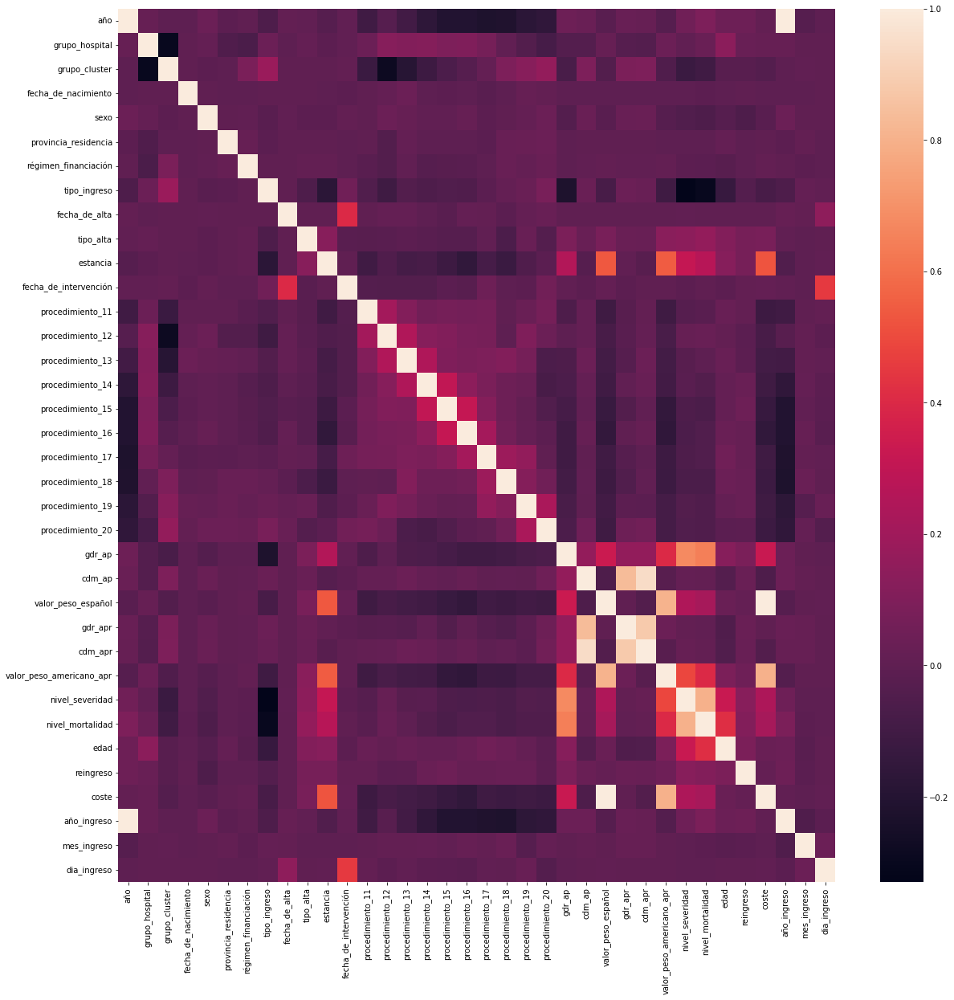

In [339]:
plt.subplots(figsize=(20,20))
sns.heatmap(df.corr())

In [340]:
df.select_dtypes('number').describe()

,año,grupo_hospital,grupo_cluster,fecha_de_nacimiento,sexo,provincia_residencia,régimen_financiación,tipo_ingreso,fecha_de_alta,tipo_alta,estancia,fecha_de_intervención,procedimiento_11,procedimiento_12,procedimiento_13,procedimiento_14,procedimiento_15,procedimiento_16,procedimiento_17,procedimiento_18,procedimiento_19,procedimiento_20,gdr_ap,cdm_ap,valor_peso_español,gdr_apr,cdm_apr,valor_peso_americano_apr,nivel_severidad,nivel_mortalidad,edad,reingreso,coste,año_ingreso,mes_ingreso,dia_ingreso
count,140937.000000,140937.000000,140937.000000,1.409370e+05,140937.000000,140937.000000,140937.000000,140937.000000,1.409370e+05,140937.000000,140937.000000,4.998000e+03,12341.000000,7648.000000,4976.000000,7378.000000,6064.000000,4901.000000,3990.000000,3357.000000,2780.000000,2123.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000,140937.000000
mean,2011.504729,3.069386,8.712382,1.550114e+07,1.385640,28.295345,1.108190,1.229322,1.602181e+07,1.148045,8.233792,1.601155e+07,89.994133,88.978576,89.173368,90.813866,90.658287,90.871745,90.641140,90.146235,90.557446,91.138337,339.322477,4.462391,0.927574,165.432335,4.482379,1.020586,2.408303,2.166997,66.232373,0.129136,4326.082895,2011.476468,6.302433,15.726154
std,2.248531,0.963666,20.757274,8.826431e+06,0.486806,5.048316,0.773977,0.505773,8.706296e+06,0.709761,10.094767,8.673040e+06,11.674164,13.366136,12.870377,9.212901,9.544991,9.400413,9.454177,9.762235,8.079143,7.419758,240.095403,2.991342,1.166974,128.710834,2.995818,0.947053,0.891282,0.967887,17.506537,0.335351,5533.796695,2.256798,3.651496,8.781809
min,2008.000000,1.000000,1.000000,1.011900e+06,1.000000,1.000000,1.000000,1.000000,1.012008e+06,1.000000,0.000000,1.012013e+06,0.120000,0.140000,0.120000,0.140000,0.140000,0.140000,0.140000,0.140000,0.140000,0.140000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,1.000000,1.000000
25%,2010.000000,2.000000,3.000000,8.041947e+06,1.000000,28.000000,1.000000,1.000000,9.012009e+06,1.000000,3.000000,9.022010e+06,89.390000,88.927500,89.370000,89.170000,89.370000,89.520000,89.520000,89.370000,89.370000,89.520000,88.000000,4.000000,0.634600,136.000000,4.000000,0.607200,2.000000,1.000000,57.000000,0.000000,3020.730000,2010.000000,3.000000,8.000000
50%,2012.000000,3.000000,4.000000,1.510195e+07,1.000000,28.000000,1.000000,1.000000,1.605201e+07,1.000000,6.000000,1.608201e+07,90.490000,90.420000,90.460000,90.410000,90.310000,90.490000,90.420000,90.410000,90.410000,90.590000,539.000000,4.000000,0.830500,140.000000,4.000000,0.905700,3.000000,2.000000,70.000000,0.000000,4040.280000,2011.000000,6.000000,16.000000
75%,2013.000000,4.000000,5.000000,2.307194e+07,2.000000,28.000000,1.000000,1.000000,2.312201e+07,1.000000,10.000000,2.311201e+07,93.960000,93.940000,93.940000,93.960000,93.960000,93.960000,93.940000,92.180000,92.140000,93.940000,541.000000,4.000000,0.949800,141.000000,4.000000,1.047400,3.000000,3.000000,79.000000,0.000000,4584.570000,2013.000000,10.000000,23.000000
max,2015.000000,4.000000,99.000000,3.112201e+07,3.000000,99.000000,9.000000,9.000000,3.112202e+07,9.000000,623.000000,3.112201e+07,99.840000,99.990000,99.910000,99.990000,99.840000,99.940000,99.840000,99.840000,99.840000,99.840000,901.000000,25.000000,23.036400,956.000000,25.000000,17.419400,4.000000,4.000000,110.000000,1.000000,116051.540000,2015.000000,12.000000,31.000000


In [341]:
df.grupo_hospital.value_counts(dropna=False)

4    60908
3    38661
2    31607
1     9761
Name: grupo_hospital, dtype: int64

In [342]:
df.grupo_cluster.value_counts(dropna=False)

4     46866
5     41405
3     26713
2      7183
99     7056
1      5985
6      5729
Name: grupo_cluster, dtype: int64

In [343]:
df.provincia_residencia.value_counts(dropna=False)

28    137962
99       585
45       359
53       195
19       189
13       170
40       108
10       103
5         91
16        87
6         86
11        68
30        60
24        57
35        56
47        49
50        48
38        46
3         45
18        40
33        33
8         30
2         29
7         28
9         28
37        25
29        24
41        24
36        23
14        23
27        21
46        19
15        19
42        19
4         19
49        18
23        18
39        16
34        15
48        13
51        12
31        12
20        11
32        10
26        10
21         8
12         6
1          5
44         5
17         3
43         3
52         2
22         1
25         1
Name: provincia_residencia, dtype: int64

In [344]:
df.régimen_financiación.value_counts(dropna=False)

1    137449
3      1518
6       978
9       659
8       252
5        43
4        38
Name: régimen_financiación, dtype: int64

In [345]:
df.tipo_ingreso.value_counts(dropna=False)

1    110010
2     30728
9       199
Name: tipo_ingreso, dtype: int64

In [346]:
df.tipo_alta.value_counts(dropna=False)

1    133930
4      4824
2       875
5       557
3       453
9       298
Name: tipo_alta, dtype: int64

In [347]:
conditionlist = [
    (df['edad'] <= 12) ,
    (df['edad'] > 12) & (df['edad'] <=18),
    (df['edad'] >18) & (df['edad'] <=26),
    (df['edad'] >=27) & (df['edad'] <=59),
    (df['edad']>=60)]
choicelist = ['Niño','Adolescente', 'Joven', 'Adulto','Persona Mayor']
df['grupo_edad'] = np.select(conditionlist, choicelist, default='Not Specified')

<AxesSubplot:title={'center':'estancia'}, xlabel='[grupo_edad]'>

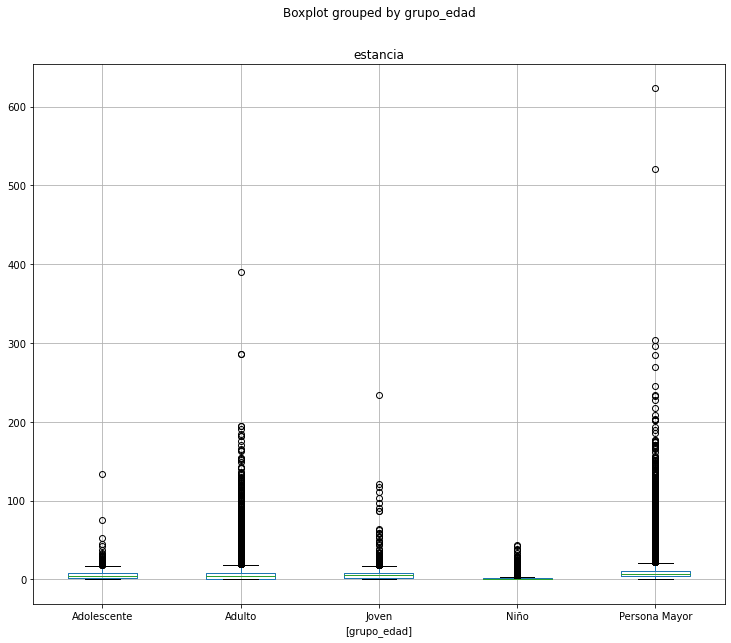

In [348]:
df[['grupo_edad','estancia']].boxplot(by='grupo_edad',figsize=(12,10))


In [349]:
df.corr()['edad'].sort_values(ascending=False)

edad                        1.000000
nivel_mortalidad            0.415884
nivel_severidad             0.328792
grupo_hospital              0.133830
gdr_ap                      0.120839
estancia                    0.118842
tipo_alta                   0.110591
valor_peso_americano_apr    0.087202
reingreso                   0.086420
procedimiento_17            0.053349
año                         0.040849
año_ingreso                 0.037610
procedimiento_18            0.037230
procedimiento_16            0.032834
valor_peso_español          0.032685
coste                       0.032284
procedimiento_13            0.028031
procedimiento_11            0.024907
procedimiento_14            0.017342
procedimiento_15            0.016560
procedimiento_19            0.016062
provincia_residencia        0.015848
procedimiento_12            0.008433
dia_ingreso                 0.000902
fecha_de_alta               0.000444
fecha_de_nacimiento        -0.003755
fecha_de_intervención      -0.008170
p

In [350]:
df.corr()['estancia'].sort_values(ascending=False)

estancia                    1.000000
valor_peso_americano_apr    0.545374
valor_peso_español          0.532703
coste                       0.527187
nivel_severidad             0.312185
nivel_mortalidad            0.272019
gdr_ap                      0.253979
tipo_alta                   0.124386
edad                        0.118842
reingreso                   0.074027
régimen_financiación        0.009893
dia_ingreso                 0.004755
gdr_apr                     0.003686
fecha_de_intervención       0.001639
provincia_residencia        0.000313
fecha_de_alta              -0.000206
grupo_cluster              -0.000623
fecha_de_nacimiento        -0.002552
mes_ingreso                -0.006230
sexo                       -0.009876
grupo_hospital             -0.011666
procedimiento_20           -0.015590
cdm_apr                    -0.023846
año                        -0.030515
cdm_ap                     -0.032888
año_ingreso                -0.045948
procedimiento_19           -0.049988
p

In [351]:
df.corr()['coste'].sort_values(ascending=False)			

coste                       1.000000
valor_peso_español          0.996378
valor_peso_americano_apr    0.800385
estancia                    0.527187
gdr_ap                      0.328598
nivel_severidad             0.240144
nivel_mortalidad            0.215871
tipo_alta                   0.079083
edad                        0.032284
grupo_hospital              0.021125
reingreso                   0.016368
fecha_de_intervención       0.014243
régimen_financiación        0.011479
año                         0.010191
dia_ingreso                 0.004508
año_ingreso                 0.003283
gdr_apr                     0.002322
provincia_residencia       -0.000938
fecha_de_alta              -0.001295
mes_ingreso                -0.002420
fecha_de_nacimiento        -0.004854
sexo                       -0.019226
grupo_cluster              -0.038238
cdm_apr                    -0.041377
cdm_ap                     -0.056967
tipo_ingreso               -0.076619
procedimiento_12           -0.079736
p

In [352]:
df.corr()['valor_peso_español'].sort_values(ascending=False)

valor_peso_español          1.000000
coste                       0.996378
valor_peso_americano_apr    0.804885
estancia                    0.532703
gdr_ap                      0.332888
nivel_severidad             0.242389
nivel_mortalidad            0.216155
tipo_alta                   0.080082
edad                        0.032685
grupo_hospital              0.021226
reingreso                   0.015405
fecha_de_intervención       0.014758
régimen_financiación        0.011053
dia_ingreso                 0.004893
provincia_residencia        0.001664
gdr_apr                     0.001554
mes_ingreso                -0.000990
fecha_de_alta              -0.001089
fecha_de_nacimiento        -0.004772
sexo                       -0.020847
año                        -0.022892
año_ingreso                -0.029819
grupo_cluster              -0.038671
cdm_apr                    -0.042143
cdm_ap                     -0.058313
procedimiento_12           -0.075800
tipo_ingreso               -0.077084
p

In [353]:
df['ingreso_mes_año']=df.fecha_de_ingreso.dt.strftime('%m-%Y')

In [354]:
df.ingreso_mes_año=pd.to_datetime(df.ingreso_mes_año)

In [355]:
px.line(df.groupby('ingreso_mes_año').count().reset_index().sort_values('ingreso_mes_año').rename(columns={"fecha_de_ingreso": "numero de ingresos"}),x='ingreso_mes_año',y="numero de ingresos")

In [356]:
features=['grupo_cluster','sexo','fecha_de_ingreso','admission_date','dia_ingreso','mes_ingreso','año_ingreso','tipo_ingreso','estancia','historia_recodificada','cip_recodificado','diagnóstico_principal','diagnóstico_2','procedimiento_1','valor_peso_español','nivel_severidad','nivel_mortalidad','servicio','edad','reingreso','coste']

In [357]:
len(features)

21

<AxesSubplot:title={'center':'edad'}, xlabel='[tipo_ingreso]'>

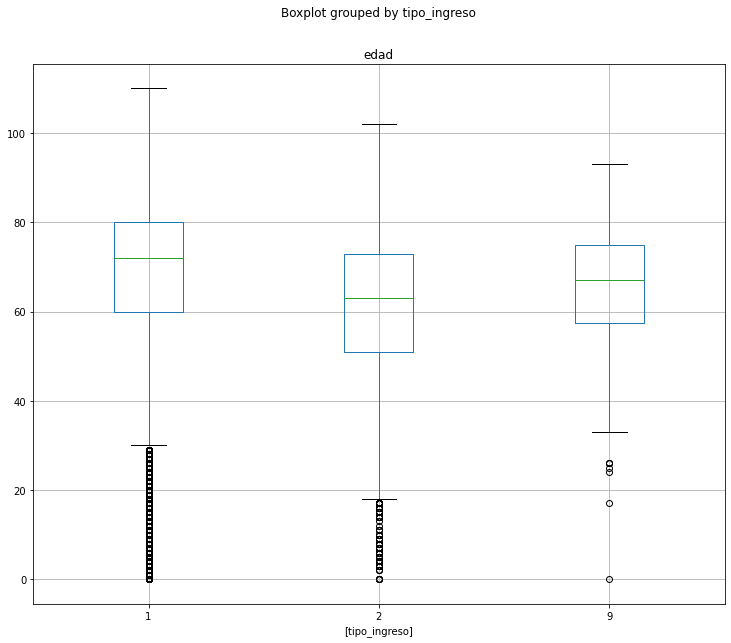

In [358]:
df[['tipo_ingreso','edad']].boxplot(by='tipo_ingreso',figsize=(12,10))

<AxesSubplot:title={'center':'estancia'}, xlabel='[sexo]'>

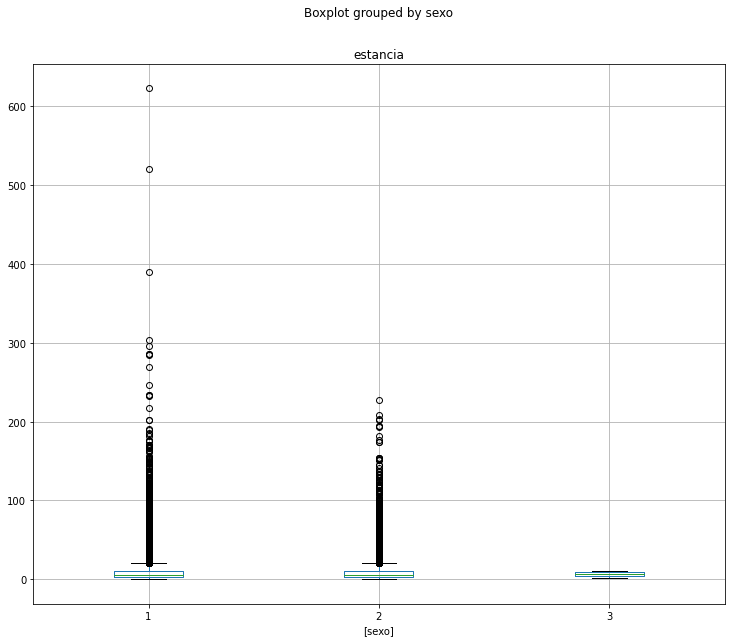

In [359]:
df[['estancia','sexo']].boxplot(by='sexo',figsize=(12,10))

In [360]:
px.bar(df[['nivel_severidad','sexo']].groupby(by='sexo').value_counts().reset_index().set_index(['sexo','nivel_severidad']).reset_index().rename(columns={0:'valor'}),x='nivel_severidad',y='valor',color='sexo')

In [361]:
df.ingreso_mes_año.value_counts()

2015-01-01    2226
2011-01-01    2134
2012-01-01    2130
2014-01-01    1887
2013-12-01    1879
              ... 
2007-12-01     549
2007-11-01      19
2007-10-01       3
2007-09-01       3
2007-08-01       2
Name: ingreso_mes_año, Length: 101, dtype: int64

In [362]:
df[features].head()

,grupo_cluster,sexo,fecha_de_ingreso,admission_date,dia_ingreso,mes_ingreso,año_ingreso,tipo_ingreso,estancia,historia_recodificada,cip_recodificado,diagnóstico_principal,diagnóstico_2,procedimiento_1,valor_peso_español,nivel_severidad,nivel_mortalidad,servicio,edad,reingreso,coste
0,4,1,2013-10-30,2013-10-30,30,10,2013,1,14,-1687781257578748014,-320943158-171303395,428.0,NaN,39.96,0.9181,3,2,NML,69,1,4441.45
1,4,1,2013-03-19,2013-03-19,19,3,2013,1,6,166370745435838543,648485069584850511,491.21,NaN,90.42,0.9407,3,3,NML,75,0,4550.50
2,4,1,2013-11-15,2013-11-15,15,11,2013,1,11,183632305468848809,899288196-1988273609,428.0,NaN,90.42,0.9181,4,4,NML,90,0,4441.45
3,5,2,2013-04-28,2013-04-28,28,4,2013,1,16,2877111881585847151,-961279109-1723117644,428.1,NaN,88.72,0.9181,3,4,NML,56,0,4441.45
4,3,1,2013-02-07,2013-02-07,7,2,2013,2,1,17519509571482774643,-33451060035352825,162.5,NaN,33.26,0.9844,2,2,NML,84,0,4761.87


In [363]:
df=df[features]

<AxesSubplot:>

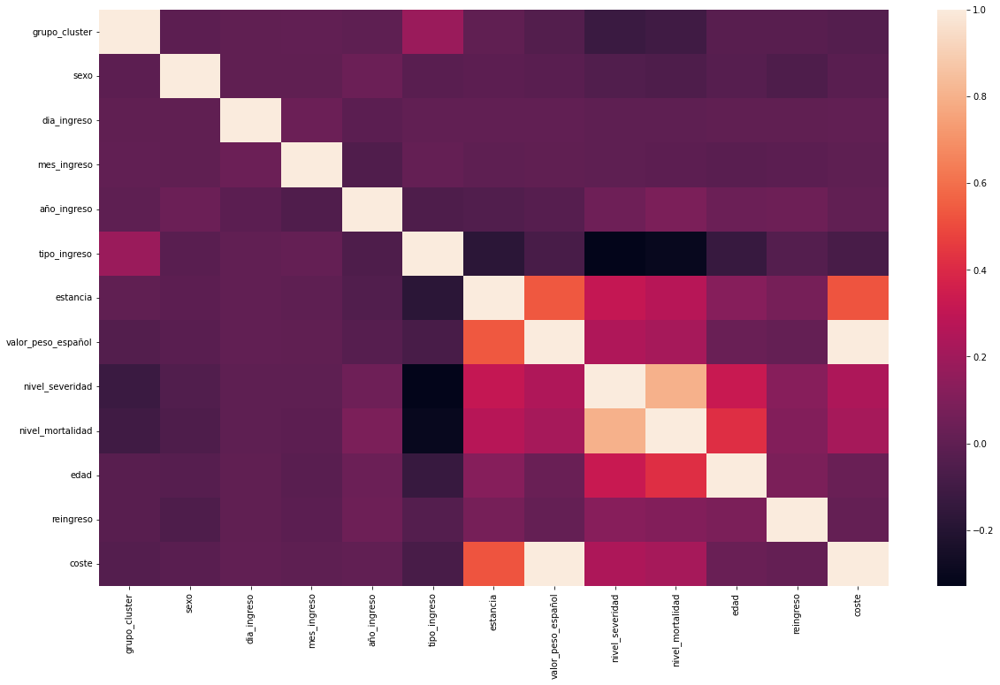

In [364]:
plt.subplots(figsize=(20,12))
sns.heatmap(df.corr())

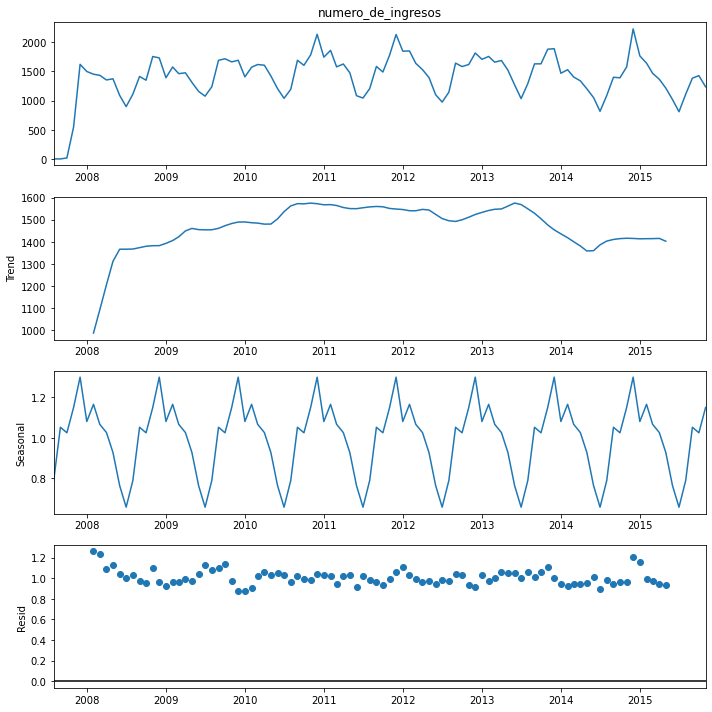

In [365]:
df_def=pd.read_csv('data/df_definitivo.csv',parse_dates=['fecha'])
df_serie_temporal = df_def.loc[:,['fecha','numero_de_ingresos']]
df_serie_temporal['fecha'] = pd.to_datetime(df_serie_temporal['fecha'])
df_serie_temporal.set_index(keys='fecha',inplace=True)
df_serie_temporal.dropna(inplace=True)

estacionalidad = seasonal_decompose(
    df_serie_temporal['numero_de_ingresos'],
    model='multiplicative',
    period=12
)

fig = estacionalidad.plot()
fig.set_size_inches(10,10)
fig.tight_layout()
plt.show()

## Calidad del aire

In [366]:
Ds = df_calidad_aire.columns[[x.startswith('D') for x in df_calidad_aire.columns]]

In [367]:
df_d = df_calidad_aire[Ds]

In [368]:
df_d.fillna(0,inplace=True)

C:\Users\carlo\AppData\Local\Temp/ipykernel_12100/1522000805.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [369]:
df_calidad_aire['value'] = df_d.mean(axis=1)

In [370]:
df_calidad_aire = df_calidad_aire[['PUNTO_MUESTREO','MAGNITUD','ANO','MES','value']]

In [371]:
df_calidad_aire['fecha'] = df_calidad_aire['ANO'].astype(str) + '-' + df_calidad_aire['MES'].astype(str)

C:\Users\carlo\AppData\Local\Temp/ipykernel_12100/2462284980.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [372]:
df_calidad_aire['fecha'] = pd.to_datetime(df_calidad_aire['fecha'])

C:\Users\carlo\AppData\Local\Temp/ipykernel_12100/1430271777.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [373]:
df_magnitud = df_calidad_aire.groupby(['MAGNITUD','fecha']).mean().reset_index()

In [374]:
px.line(df_magnitud,x='fecha',y='value',color='MAGNITUD')

In [375]:
magnitud_nombre={1:'Dióxido de Azufre',6:'Monóxido de Carbono',
  7:'Monóxido de Nitrógeno',  8:'Dióxido de Nitrógeno', 
   9:'Partículas menor 2.5 μm', 10:'Partículas menor 10 μm', 
   12:'Óxidos de Nitrógeno', 14:'Ozono', 20:'Tolueno', 
   30:'Benceno', 35:'Etilbenceno', 42:'Hidrocarburos totales (hexano)', 
   43:'Metano', 44:'Hidrocarburos no metánicos (hexano)'}

In [376]:
def set_values(row, value):
    return value[row]

In [377]:
df_magnitud['MAGNITUD_NOMBRE']=df_magnitud.MAGNITUD.apply(set_values,args=(magnitud_nombre,))

In [378]:
px.line(df_magnitud.reset_index(),x='fecha',y='value',color='MAGNITUD_NOMBRE')

In [379]:
df_umbrales = pd.read_excel('data/Umbrales.xlsx')

In [380]:
df_fin = df_magnitud.merge(df_umbrales, left_on='MAGNITUD',right_on='CODIGO', how='inner')

In [381]:
particulas=['Dióxido de Azufre','Monóxido de Carbono','Dióxido de Nitrógeno','Partículas menor 2,5 μm','Partículas menor 10 μm','Óxidos de Nitrógeno','Ozono','Benceno']

In [382]:
df_fin.drop(['CODIGO','MAGNITUD_y'],axis=1,inplace=True)

In [383]:
df_fin.columns = ['CODIGO','fecha','ANO','MES', 'value', 'PARTICULA', 'ABREVIATURA','MEDIDA','LIMITE', 'COMENTARIO']

In [384]:
df_fin.loc[(df_fin.CODIGO==12) & (df_fin.MES==8) & (df_fin.ANO==2013),'value'] = np.nan
df_fin.loc[(df_fin.CODIGO==12) & (df_fin.MES==8) & (df_fin.ANO==2013),'value'] = df_fin.loc[(df_fin.CODIGO==12) & (df_fin.MES==8)].value.mean()

In [385]:
df_fin.sample(20)

,CODIGO,fecha,ANO,MES,value,PARTICULA,ABREVIATURA,MEDIDA,LIMITE,COMENTARIO
725,12,2013-06-01,2013.0,6.0,34.205645,Óxidos de Nitrógeno,NOx,μg/m 3,30,Afecta a la vegetación
192,6,2014-01-01,2014.0,1.0,0.422903,Monóxido de Carbono,CO,μg/m 3,10,Máxima diaria de las medias móviles octohorarias
515,10,2010-06-01,2010.0,6.0,18.379032,Partículas menor 10 μm,PM10,μg/m 3,50,Media diaria. No podrá superarse en más de 35 ...
245,8,2009-06-01,2009.0,6.0,35.014888,Dióxido de Nitrógeno,NO3,μg/m 4,400,"Alerta. Media horaria, durante 3 horas consecu..."
843,14,2014-04-01,2014.0,4.0,51.884793,Ozono,O3,μg/m 3,120,Máxima diaria de las medias móviles octohorari...
318,8,2015-07-01,2015.0,7.0,33.353495,Dióxido de Nitrógeno,NO3,μg/m 4,400,"Alerta. Media horaria, durante 3 horas consecu..."
409,9,2014-02-01,2014.0,2.0,7.107527,Partículas menor 2.5 μm,PM2.5,μg/m 3,25,Media anual
59,1,2011-12-01,2011.0,12.0,7.332258,Dióxido de Azufre,SO3,μg/m 4,500,Alerta. Media horaria durante 3 horas consecut...
183,6,2013-04-01,2013.0,4.0,0.278065,Monóxido de Carbono,CO,μg/m 3,10,Máxima diaria de las medias móviles octohorarias
865,30,2007-02-01,2007.0,2.0,0.503226,Benceno,BEN,μg/m 3,5,Media anual


## Datos Climatológicos

In [386]:
df_temperatura=df_temperatura[['fecha','tm_mes','hr','p_max','p_mes']]

In [387]:
df_temperatura.p_max=df_temperatura.p_max.str.slice(0,3).astype('float')

In [388]:
df_temperatura.fecha=pd.to_datetime(df_temperatura.fecha)

In [389]:
df_temperatura.tm_mes.interpolate(method="akima",inplace=True)
df_temperatura.hr.interpolate(method="akima",inplace=True)
df_temperatura.p_max.interpolate(method="akima",inplace=True)
df_temperatura.p_mes.interpolate(method="akima",inplace=True)

In [390]:
px.line(df_temperatura,x='fecha',y=['p_max','hr','p_mes','tm_mes'])

In [391]:
df_temperatura.rename(columns={'tm_mes':'temperatura_media_mes','hr':'humedad_relativa','p_max':'precipitaciones','p_mes':'presion_atmosferica_mes'},inplace=True)

## Diagnósticos

In [392]:
enfermedad_pulmonar_obstructiva_cronica = [
    '491.0', '491.1', '491.20', '491.21', '491.22', '491.8', '491.9', '492.0', '492.8', '494', '494.0', '494.1', '496'
]

bronquitis_aguda = [
    '466.0','490'
]

asma = [
    '493.00', '493.01', '493.02', '493.10', '493.11', '493.12', '493.20', '493.21', '493.22', '493.81', '493.82', '493.90', '493.91', '493.92'
]

fibrosis_quistica_o_anomalias_sistema_respiratorio = [
    '277.00', '277.01', '277.02','277.03', '277.09', '516.61','516.62', '516.63', '516.64', '516.69', '747.21', '748.3', '748.4', '748.5', '748.60', '748.61', '748.69', '748.8', '748.9', '750.3', '759.3','770.7'
]

insuficiencia_cardiaca_congestiva = [
    '398.91', '402.01', '402.11', '402.91', '404.01', '404.03', '404.11', '404.13', '404.91', '404.93', '428.0', '428.1', '428.20', '428.21', '428.22', '428.23', '428.30', '428.31', '428.32', '428.33', '428.40', '428.41', '428.42', '428.43', '428.9'
]

hipertension_arterial = [
    '401.0', '401.9', '402.00', '402.10', '402.90', '403.00', '403.10', '403.90', '404.00', '404.10', '404.90'
]


neumonia_bacteriana = [
    '481', '482.2', '482.30', '482,31', '482.32', '482.39', '482.41', '482.42', '482.9', '483.0', '483.1', '483.8', '485', '486'
]

anemia_falciforme_o_enfermedad_hemoglobina_S = [
    '282.41', '282.42', '282.60', '282.61', '282.62', '282.63', '282.64', '282.68', '282.69'
]

diabetes_incontrolada_sin_complicacion = [
    '250.02','250.03'
]

diabetes_con_complicacion_aguda = [
    '250.10', '250,11', '250.12', '250.13', '250.20', '250.21','250.22','250.23', '250.30', '250.31', '250.32', '250.33'
]

diabetes_con_complicacion_cronica = [
    '250.40', '250.41', '250.42', '250.43', '250.50', '250.51', '250.52', '250.53', '250.60', '250.61', '250.62', '250.63', '250.70', '250.71', '250.72', '250.73', '250.80','250.81', '250.82', '250.83', '250.90', '250.91', '250.92', '250.93'
]

infarto_agudo_de_miocardio = [
    '410.01','410.11','410.21','410.31','410.41','410.51','410.71','410.81','410.90','410.91'
]

## Procedimientos

In [393]:
dialisis = [
    '38.95', '39.27', '39.29', '39.42', '39.43', '39.93', '39.94'
]

## Enfermedades

In [394]:
pqi_01_complicaciones_a_corto_plazo_de_la_diabetes = (
    (df['diagnóstico_principal'].isin(diabetes_con_complicacion_aguda))
    &
    (df['edad'] >= 15)
)

pqi_03_complicaciones_a_largo_plazo_de_la_diabetes = (
    (df['diagnóstico_principal'].isin(diabetes_con_complicacion_cronica))
    &
    (df['edad'] >= 15)
)

pqi_05_enfermedad_pulmonar_obstructiva_cronica_o_asma_en_mayores = (
    (
    (df['diagnóstico_principal'].isin(enfermedad_pulmonar_obstructiva_cronica)) |
    ((df['diagnóstico_principal'].isin(bronquitis_aguda)) & (df['diagnóstico_2'].isin(enfermedad_pulmonar_obstructiva_cronica))) |
    (df['diagnóstico_principal'].isin(asma))
    ) 
    & 
    (df['edad'] >= 40) 
    &
    ~(df['diagnóstico_2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
)

pqi_07_hipertension_arterial = (
    (df['diagnóstico_principal'].isin(hipertension_arterial))
    &
    (df['edad'] >= 15)
    & 
    (df['procedimiento_1'].isin(dialisis)) 
)

pqi_08_insuficiencia_cardiaca_congestiva  = (
    (df['diagnóstico_principal'].isin(insuficiencia_cardiaca_congestiva))
    &
    (df['edad'] >= 15) 
)

pqi_11_neumonia_bacteriana = (
    (df['diagnóstico_principal'].isin(neumonia_bacteriana))
    &
    (df['edad'] >= 15)
    & 
    ~(df['diagnóstico_2'].isin(anemia_falciforme_o_enfermedad_hemoglobina_S))
)

pqi_14_diabetes_incontrolada_sin_complicacion = (
    (df['diagnóstico_principal'].isin(diabetes_incontrolada_sin_complicacion))
    &
    (df['edad'] >= 15)
)

pqi_15_asma_en_adultos_jovenes_15_39_anos = (
    (df['diagnóstico_principal'].isin(asma))
    &
    ((df['edad'] >= 18) & (df['edad'] < 39))
    & 
    ~ (
        (df['diagnóstico_principal'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
        |
        (df['diagnóstico_2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
    )
)

hospitalizacion_por_infarto_agudo_de_miocardio = (
    df['diagnóstico_principal'].isin(infarto_agudo_de_miocardio)
)

## Condiciones crónicas

In [395]:
complicaciones_a_corto_plazo_de_la_diabetes_en_poblacion_infantil = (
    (df['diagnóstico_principal'].isin(diabetes_con_complicacion_aguda))
    &
    ((df['edad'] >= 6) & (df['edad'] < 15))
)

hospitalizacion_por_asma_en_poblacion_infantil = (
    (df['diagnóstico_principal'].isin(asma))
    &
    ((df['edad'] >= 2) & (df['edad'] < 15))
    & 
    ~(
        (df['diagnóstico_principal'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
        |
        (df['diagnóstico_2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
    )
)

In [396]:
diagnosis_dict = {
    'enfermedad pulmonar obstructiva cronica': enfermedad_pulmonar_obstructiva_cronica,
    'bronquitis aguda': bronquitis_aguda,
    'asma': asma,
    'fibrosis quistica o anomalias sistema respiratorio': fibrosis_quistica_o_anomalias_sistema_respiratorio,
    'insuficiencia cardiaca congestiva': insuficiencia_cardiaca_congestiva,
    'hipertension arterial': hipertension_arterial,
    'neumonia bacteriana': neumonia_bacteriana,
    'anemia falciforme o enfermedad hemoglobina S': anemia_falciforme_o_enfermedad_hemoglobina_S,
    'diabetes incontrolada sin complicacion': diabetes_incontrolada_sin_complicacion,
    'diabetes con complicacion aguda': diabetes_con_complicacion_aguda,
    'diabetes con complicacion cronica': diabetes_con_complicacion_cronica,
    'infarto agudo de miocardio': infarto_agudo_de_miocardio
}

for diagnosis, diagnosis_codes in diagnosis_dict.items():
    df.loc[
        df['diagnóstico_principal'].isin(diagnosis_codes),
        'diagnosis_name'
    ] = f'{diagnosis}'

df[['diagnóstico_principal','diagnosis_name']].head()

,diagnóstico_principal,diagnosis_name
0,428.0,insuficiencia cardiaca congestiva
1,491.21,enfermedad pulmonar obstructiva cronica
2,428.0,insuficiencia cardiaca congestiva
3,428.1,insuficiencia cardiaca congestiva
4,162.5,NaN


In [397]:
diagnosticos=list(diagnosis_dict.keys())
diagnosticos.append('fecha')
del diagnosticos[8]

In [398]:
diseases_filters_dict = {
    'PQI 01 complicaciones a corto plazo de la diabetes': pqi_01_complicaciones_a_corto_plazo_de_la_diabetes,
    'PQI 03 complicaciones a largo plazo de la diabetes': pqi_03_complicaciones_a_largo_plazo_de_la_diabetes,
    'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores': pqi_05_enfermedad_pulmonar_obstructiva_cronica_o_asma_en_mayores,
    'PQI 07 hipertension arterial': pqi_07_hipertension_arterial,
    'PQI 08 insuficiencia cardiaca congestiva': pqi_08_insuficiencia_cardiaca_congestiva,
    'PQI 11 neumonia bacteriana': pqi_11_neumonia_bacteriana,
    'PQI 14 diabetes incontrolada sin complicacion': pqi_14_diabetes_incontrolada_sin_complicacion,
    'PQI 15 asma en adultos jovenes 15 39 anos': pqi_15_asma_en_adultos_jovenes_15_39_anos,
    'hospitalizacion por infarto agudo de miocardio': hospitalizacion_por_infarto_agudo_de_miocardio,
    'complicaciones a corto plazo de la diabetes en poblacion infantil': complicaciones_a_corto_plazo_de_la_diabetes_en_poblacion_infantil,
    'hospitalizacion por asma en poblacion infantil': hospitalizacion_por_asma_en_poblacion_infantil
}

for disease, disease_filter in diseases_filters_dict.items():
    df.loc[disease_filter, 'disease_name'] = f'{disease}'

In [399]:
campos_de_agrupacion = ['admission_date','diagnosis_name']
campos_de_registro_unico = ['historia_recodificada','cip_recodificado','fecha_de_ingreso']

fig = px.line(
    data_frame = df[campos_de_agrupacion + campos_de_registro_unico].groupby(campos_de_agrupacion).count().reset_index().rename(columns={"fecha_de_ingreso": "numero de ingresos"}),
    x = 'admission_date',
    y = 'numero de ingresos',
    color = 'diagnosis_name',
    title = 'Ingresos por diagnóstico',
    width = 1500, height = 800
)

fig.update_layout(hovermode="x")

In [400]:
df['ingreso_mes_año']=df.fecha_de_ingreso.dt.strftime('%m-%Y')
df.ingreso_mes_año=pd.to_datetime(df.ingreso_mes_año)

In [401]:
campos_de_agrupacion = ['ingreso_mes_año','diagnosis_name']
campos_de_registro_unico = ['historia_recodificada','cip_recodificado','fecha_de_ingreso']

fig = px.line(
    data_frame = df[campos_de_agrupacion + campos_de_registro_unico].groupby(campos_de_agrupacion).count().reset_index().rename(columns={"fecha_de_ingreso": "numero de ingresos"}),
    x = 'ingreso_mes_año',
    y = 'numero de ingresos',
    color = 'diagnosis_name',
    title = 'Ingresos por diagnóstico',
    width = 1500, height = 800
)

fig.update_layout(hovermode="x")

In [402]:
campos_de_agrupacion = ['admission_date','disease_name']
campos_de_registro_unico = ['historia_recodificada','cip_recodificado','fecha_de_ingreso']

fig = px.line(
    data_frame = df[campos_de_agrupacion + campos_de_registro_unico].groupby(campos_de_agrupacion).count().reset_index().rename(columns={"fecha_de_ingreso": "numero de ingresos"}),
    x = 'admission_date',
    y = 'numero de ingresos',
    color = 'disease_name',
    title = 'Ingresos por enfermedad',
    width = 1500, height = 800
)

fig.update_layout(hovermode="x")

In [403]:
campos_de_agrupacion = ['ingreso_mes_año','disease_name']
campos_de_registro_unico = ['historia_recodificada','cip_recodificado','fecha_de_ingreso']

fig = px.line(
    data_frame = df[campos_de_agrupacion + campos_de_registro_unico].groupby(campos_de_agrupacion).count().reset_index().rename(columns={"fecha_de_ingreso": "numero de ingresos"}),
    x = 'ingreso_mes_año',
    y = 'numero de ingresos',
    color = 'disease_name',
    title = 'Ingresos por enfermedad',
    width = 1500, height = 800
)

fig.update_layout(hovermode="x")

In [404]:
df=df.sort_values('fecha_de_ingreso')
df.head()

,grupo_cluster,sexo,fecha_de_ingreso,admission_date,dia_ingreso,mes_ingreso,año_ingreso,tipo_ingreso,estancia,historia_recodificada,cip_recodificado,diagnóstico_principal,diagnóstico_2,procedimiento_1,valor_peso_español,nivel_severidad,nivel_mortalidad,servicio,edad,reingreso,coste,diagnosis_name,disease_name,ingreso_mes_año
16583,6,1,2007-08-02,2007-08-02,2,8,2007,2,166,-529045945-1318899342,00,011.93,292.9,87.44,2.015,2,1,NML,37,0,8381.63,NaN,NaN,2007-08-01
12521,5,2,2007-08-20,2007-08-20,20,8,2007,2,193,-1710416977-1689576786,00,150.5,038.9,31.1,16.498,4,4,NML,73,0,68625.70,NaN,NaN,2007-08-01
28366,4,1,2007-09-20,2007-09-20,20,9,2007,1,112,679077701190970178,00,394.0,041.19,31.1,16.498,4,4,NML,76,0,68625.70,NaN,NaN,2007-09-01
47906,5,1,2007-09-20,2007-09-20,20,9,2007,1,127,15168214271531108233,00,860.0,038.9,00.17,16.498,4,4,NML,79,0,68625.70,NaN,NaN,2007-09-01
60137,3,2,2007-09-29,2007-09-29,29,9,2007,1,109,1698874227-411547317,00,518.81,246.8,31.1,11.517,3,4,NML,73,0,47906.70,NaN,NaN,2007-09-01


In [405]:
df.columns

Index(['grupo_cluster', 'sexo', 'fecha_de_ingreso', 'admission_date',
       'dia_ingreso', 'mes_ingreso', 'año_ingreso', 'tipo_ingreso', 'estancia',
       'historia_recodificada', 'cip_recodificado', 'diagnóstico_principal',
       'diagnóstico_2', 'procedimiento_1', 'valor_peso_español',
       'nivel_severidad', 'nivel_mortalidad', 'servicio', 'edad', 'reingreso',
       'coste', 'diagnosis_name', 'disease_name', 'ingreso_mes_año'],
      dtype='object')

In [406]:
df_reducido = df.loc[
    ~ ( df['diagnosis_name'].isnull() | df['disease_name'].isnull() ) & ( df['estancia'] != 0 )
    ].drop_duplicates(
        subset=['historia_recodificada', 'cip_recodificado','fecha_de_ingreso'],
        keep='first'
    ).reset_index(drop=True)

df_reducido.sample(5).T    

,11050,11630,18178,35604,3696
grupo_cluster,5,3,4,5,4
sexo,2,2,1,1,1
fecha_de_ingreso,2009-06-09 00:00:00,2009-07-14 00:00:00,2010-04-24 00:00:00,2012-03-23 00:00:00,2008-06-05 00:00:00
admission_date,2009-06-09 00:00:00,2009-07-14 00:00:00,2010-04-24 00:00:00,2012-03-23 00:00:00,2008-06-05 00:00:00
dia_ingreso,9,14,24,23,5
mes_ingreso,6,7,4,3,6
año_ingreso,2009,2009,2010,2012,2008
tipo_ingreso,1,1,1,1,1
estancia,9,22,29,7,7
historia_recodificada,3014573681610061935,20547620811264969840,-1469035703778161017,1577114477404249984,981262664-849032329


In [407]:
df_reducido.loc[df_reducido.edad < 15 , 'age_group'] = '<15'
df_reducido.loc[(df_reducido.edad >= 15) & (df_reducido.edad <= 40) , 'age_group'] = '15-39'
df_reducido.loc[df_reducido.edad > 39 , 'age_group'] = '>39'

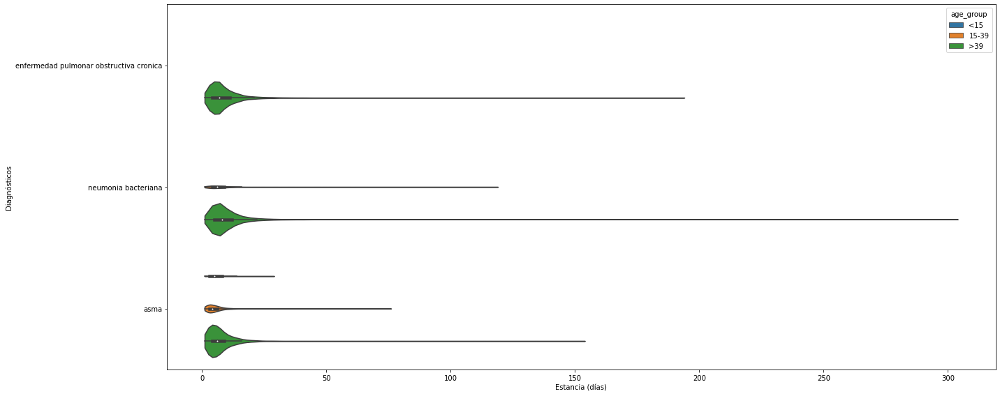

In [408]:
fig, ax = plt.subplots(figsize=(20,8))

diagnosticos_respiratorios = [
    'asma',
    'neumonia bacteriana',
    'enfermedad pulmonar obstructiva cronica'
]

fig = sns.violinplot(
    y = df_reducido.loc[df_reducido.diagnosis_name.isin(diagnosticos_respiratorios), 'diagnosis_name'],
    x = df_reducido.loc[df_reducido.diagnosis_name.isin(diagnosticos_respiratorios), 'estancia'], 
    cut=0,
    hue = df_reducido.age_group, hue_order = ['<15','15-39','>39'],
    scale = 'count', orient= 'h',
    ax = ax
)

plt.ylabel('Diagnósticos')
plt.xlabel('Estancia (días)')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

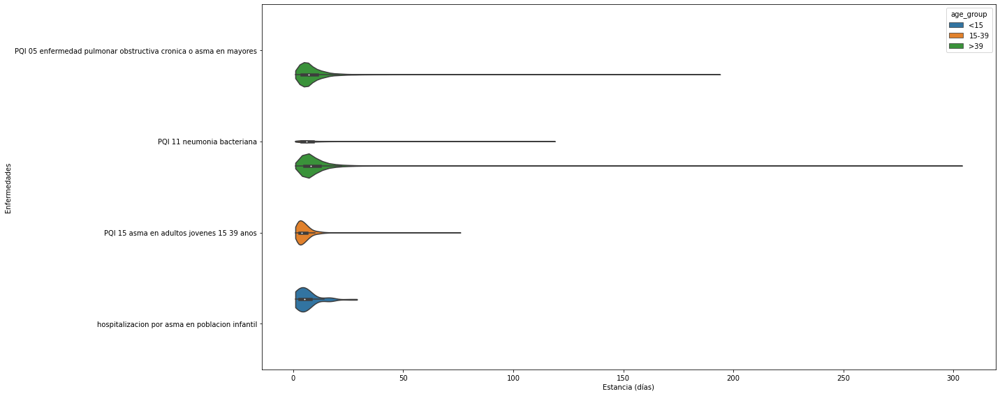

In [409]:
fig, ax = plt.subplots(figsize=(20,8))

enfermedades_respiratorias = [
    'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores',
    'PQI 11 neumonia bacteriana',
    'PQI 15 asma en adultos jovenes 15 39 anos',
    'hospitalizacion por asma en poblacion infantil'
]

fig = sns.violinplot(
    y = df_reducido.loc[df_reducido.disease_name.isin(enfermedades_respiratorias), 'disease_name'],
    x = df_reducido.loc[df_reducido.disease_name.isin(enfermedades_respiratorias), 'estancia'], 
    cut=0,
    hue = df_reducido.age_group, hue_order = ['<15','15-39','>39'],
    scale = 'count', orient= 'h',
    ax = ax
)

plt.ylabel('Enfermedades')
plt.xlabel('Estancia (días)')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

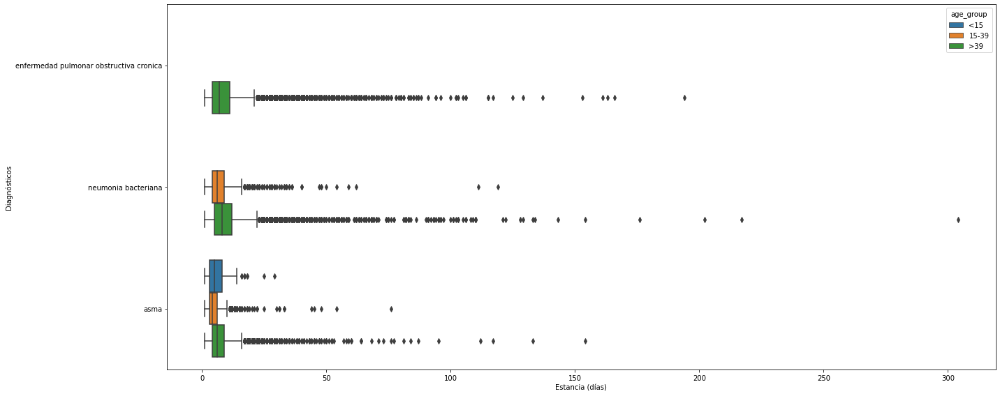

In [410]:
fig, ax = plt.subplots(figsize=(20,8))

diagnosticos_respiratorios = [
    'asma',
    'neumonia bacteriana',
    'enfermedad pulmonar obstructiva cronica'
]

fig = sns.boxplot(
    y = df_reducido.loc[df_reducido.diagnosis_name.isin(diagnosticos_respiratorios), 'diagnosis_name'],
    x = df_reducido.loc[df_reducido.diagnosis_name.isin(diagnosticos_respiratorios), 'estancia'], 
    hue = df_reducido.age_group, hue_order = ['<15','15-39','>39'],
    orient= 'h',
    ax = ax
)

plt.ylabel('Diagnósticos')
plt.xlabel('Estancia (días)')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

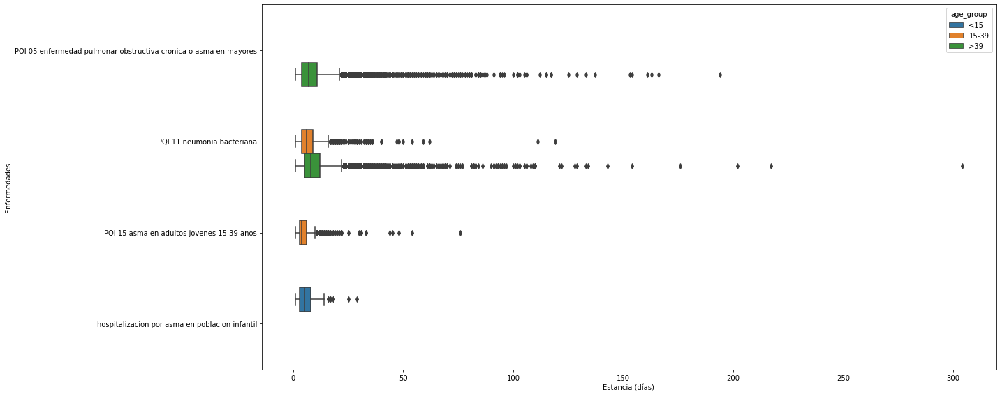

In [411]:
fig, ax = plt.subplots(figsize=(20,8))

enfermedades_respiratorias = [
    'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores',
    'PQI 11 neumonia bacteriana',
    'PQI 15 asma en adultos jovenes 15 39 anos',
    'hospitalizacion por asma en poblacion infantil'
]

fig = sns.boxplot(
    y = df_reducido.loc[df_reducido.disease_name.isin(enfermedades_respiratorias), 'disease_name'],
    x = df_reducido.loc[df_reducido.disease_name.isin(enfermedades_respiratorias), 'estancia'], 
    hue = df_reducido.age_group, hue_order = ['<15','15-39','>39'],
    orient= 'h',
    ax = ax
)

plt.ylabel('Enfermedades')
plt.xlabel('Estancia (días)')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## DF Definitivo

In [ ]:
df_num_ingresos_diagnostico=df.groupby(['año_ingreso','mes_ingreso','diagnosis_name'])['admission_date'].count().reset_index().rename(columns={"admission_date": "numero_de_ingresos"})

In [ ]:
df_num_ingresos=df.groupby(['año_ingreso','mes_ingreso'])['admission_date'].count().reset_index().rename(columns={"admission_date": "numero_de_ingresos"})

In [ ]:
df_num_ingresos['fecha']=df_num_ingresos.año_ingreso.astype('str')+'-'+df_num_ingresos.mes_ingreso.astype('str')

In [ ]:
df_num_ingresos.fecha=pd.to_datetime(df_num_ingresos.fecha,format='%Y-%m')

In [ ]:
df_num_ingresos=df_num_ingresos[['fecha','numero_de_ingresos']]

In [ ]:
df_num_ingresos.numero_de_ingresos=df_num_ingresos.numero_de_ingresos.shift(-1)

In [ ]:
df_num_ingresos.dropna(inplace=True)

In [ ]:
df_num_ingresos

,fecha,numero_de_ingresos
0,2007-08-01,3.0
1,2007-09-01,3.0
2,2007-10-01,19.0
3,2007-11-01,549.0
4,2007-12-01,1620.0
...,...,...
95,2015-07-01,810.0
96,2015-08-01,1109.0
97,2015-09-01,1384.0
98,2015-10-01,1427.0


In [ ]:
df_num_ingresos_diagnostico['mes_ano']=df_num_ingresos_diagnostico.año_ingreso.astype('str')+'-'+df_num_ingresos_diagnostico.mes_ingreso.astype('str')

In [ ]:
df_num_ingresos_diagnostico.mes_ano=pd.to_datetime(df_num_ingresos_diagnostico.mes_ano,format='%Y-%m')

In [ ]:
df_num_ingresos_diagnostico_pivot=df_num_ingresos_diagnostico.pivot('mes_ano','diagnosis_name','numero_de_ingresos').reset_index()

In [ ]:
df_magnitud.ANO=df_magnitud.ANO.astype('int')
df_magnitud.MES=df_magnitud.MES.astype('int')

In [ ]:
df_merge=df_num_ingresos.merge(df_fin,on=['fecha'],how='inner')

In [ ]:
df_merge.sample(20)

,fecha,numero_de_ingresos,CODIGO,ANO,MES,value,PARTICULA,ABREVIATURA,MEDIDA,LIMITE,COMENTARIO
188,2009-04-01,1475.0,30,2009.0,4.0,0.370968,Benceno,BEN,μg/m 3,5,Media anual
23,2007-10-01,19.0,10,2007.0,10.0,26.752688,Partículas menor 10 μm,PM10,μg/m 3,50,Media diaria. No podrá superarse en más de 35 ...
799,2014-12-01,2226.0,14,2014.0,12.0,21.509217,Ozono,O3,μg/m 3,120,Máxima diaria de las medias móviles octohorari...
90,2008-06-01,1089.0,1,2008.0,6.0,6.854839,Dióxido de Azufre,SO3,μg/m 4,500,Alerta. Media horaria durante 3 horas consecut...
434,2011-08-01,1205.0,8,2011.0,8.0,33.827957,Dióxido de Nitrógeno,NO3,μg/m 4,400,"Alerta. Media horaria, durante 3 horas consecu..."
884,2015-10-01,1427.0,8,2015.0,10.0,42.154570,Dióxido de Nitrógeno,NO3,μg/m 4,400,"Alerta. Media horaria, durante 3 horas consecu..."
335,2010-09-01,1690.0,8,2010.0,9.0,46.471248,Dióxido de Nitrógeno,NO3,μg/m 4,400,"Alerta. Media horaria, durante 3 horas consecu..."
464,2011-11-01,1778.0,10,2011.0,11.0,19.225806,Partículas menor 10 μm,PM10,μg/m 3,50,Media diaria. No podrá superarse en más de 35 ...
264,2010-01-01,1406.0,9,2010.0,1.0,10.096774,Partículas menor 2.5 μm,PM2.5,μg/m 3,25,Media anual
86,2008-05-01,1373.0,10,2008.0,5.0,21.553763,Partículas menor 10 μm,PM10,μg/m 3,50,Media diaria. No podrá superarse en más de 35 ...


In [ ]:
df_merge.drop(['COMENTARIO','ABREVIATURA','MEDIDA','ANO','MES'],axis=1,inplace=True)

In [ ]:
df_merge.head(10)

,fecha,numero_de_ingresos,CODIGO,value,PARTICULA,LIMITE
0,2007-08-01,3.0,1,6.366935,Dióxido de Azufre,500
1,2007-08-01,3.0,6,0.234677,Monóxido de Carbono,10
2,2007-08-01,3.0,8,30.892473,Dióxido de Nitrógeno,400
3,2007-08-01,3.0,9,14.887097,Partículas menor 2.5 μm,25
4,2007-08-01,3.0,10,34.865591,Partículas menor 10 μm,40
5,2007-08-01,3.0,10,34.865591,Partículas menor 10 μm,50
6,2007-08-01,3.0,12,46.169355,Óxidos de Nitrógeno,30
7,2007-08-01,3.0,14,59.720430,Ozono,120
8,2007-08-01,3.0,30,0.375806,Benceno,5
9,2007-09-01,3.0,1,5.955645,Dióxido de Azufre,500


In [ ]:
df_def=pd.pivot_table(df_merge,index='fecha',columns='PARTICULA',values='value').reset_index().merge(df_num_ingresos,on='fecha',how='left').merge(df_temperatura,on='fecha',how='left')

In [ ]:
df_def[diagnosticos[:-1]]=df_def[diagnosticos[:-1]].shift(-1)

In [ ]:
df_def['Benceno_1_mes']=df_def.Benceno.shift()
df_def['Benceno_2_meses']=df_def.Benceno.shift(2)
df_def['Benceno_3_meses']=df_def.Benceno.shift(3)
df_def['DióxidodDeAzufre_1_mes']=df_def['Dióxido de Azufre'].shift()
df_def['DióxidodDeAzufre_2_meses']=df_def['Dióxido de Azufre'].shift(2)
df_def['DióxidodDeAzufre_3_meses']=df_def['Dióxido de Azufre'].shift(3)
df_def['Ozono_1_mes']=df_def.Ozono.shift()
df_def['Ozono_2_meses']=df_def.Ozono.shift(2)
df_def['Ozono_3_meses']=df_def.Ozono.shift(3)
df_def['DióxidodDeNitrogeno_1_mes']=df_def['Dióxido de Nitrógeno'].shift()
df_def['DióxidodDeNitrogeno_2_meses']=df_def['Dióxido de Nitrógeno'].shift(2)
df_def['DióxidodDeNitrogeno_3_meses']=df_def['Dióxido de Nitrógeno'].shift(3)
df_def['MonoxidoDeCarbono_1_mes']=df_def['Monóxido de Carbono'].shift()
df_def['MonoxidoDeCarbono_2_meses']=df_def['Monóxido de Carbono'].shift(2)
df_def['MonoxidoDeCarbono_3_meses']=df_def['Monóxido de Carbono'].shift(3)
df_def['OxidosDeNitrogeno_1_mes']=df_def['Óxidos de Nitrógeno'].shift()
df_def['OxidosDeNitrogeno_2_meses']=df_def['Óxidos de Nitrógeno'].shift(2)
df_def['OxidosDeNitrogeno_3_meses']=df_def['Óxidos de Nitrógeno'].shift(3)
df_def['Particulas10_1_mes']=df_def['Partículas menor 10 μm'].shift()
df_def['Particulas10_2_meses']=df_def['Partículas menor 10 μm'].shift(2)
df_def['Particulas10_3_meses']=df_def['Partículas menor 10 μm'].shift(3)
df_def['Particulas2.5_1_mes']=df_def['Partículas menor 2.5 μm'].shift()
df_def['Particulas2.5_2_meses']=df_def['Partículas menor 2.5 μm'].shift(2)
df_def['Particulas2.5_3_meses']=df_def['Partículas menor 2.5 μm'].shift(3)
df_def['ingresos_año_anterior']=df_def.numero_de_ingresos.shift(12)
df_def['mes']=df_def.fecha.dt.month

In [3]:
df_def=pd.read_csv('data/df_definitivo.csv',parse_dates=['fecha'])
df_def_diagnosticos=pd.read_csv('data/df_definitivo_por_diagnosticos.csv',parse_dates=['fecha'])

## EDA sobre df definitivo

Obtenemos la matriz de correlación de las variables de interés (están comentadas algunas para que la matriz no quede excesivamente grande)

In [4]:
corr_df_def = df_def_diagnosticos[[
    'Benceno', 
    'Dióxido de Azufre', 
    'Dióxido de Nitrógeno',
    'Monóxido de Carbono', 
    'Ozono', 
    'Partículas menor 10 μm',
    'Partículas menor 2.5 μm', 
    'Óxidos de Nitrógeno',
    'enfermedad pulmonar obstructiva cronica', 
    'asma',
    'neumonia bacteriana',
    'temperatura_media_mes',
    'humedad_relativa', 
    'precipitaciones', 
    'presion_atmosferica_mes',
    'Benceno_1_mes', 
    'Benceno_2_meses', 
    'Benceno_3_meses',
    'DióxidodDeAzufre_1_mes', 
    'DióxidodDeAzufre_2_meses',
    'DióxidodDeAzufre_3_meses', 
    'Ozono_1_mes', 
    'Ozono_2_meses',
    'Ozono_3_meses', 
    'DióxidodDeNitrogeno_1_mes',
    'DióxidodDeNitrogeno_2_meses', 
    'DióxidodDeNitrogeno_3_meses',
    'MonoxidoDeCarbono_1_mes', 
    'MonoxidoDeCarbono_2_meses',
    'MonoxidoDeCarbono_3_meses', 
    'OxidosDeNitrogeno_1_mes',
    'OxidosDeNitrogeno_2_meses', 
    'OxidosDeNitrogeno_3_meses',
    'Particulas10_1_mes', 
    'Particulas10_2_meses', 
    'Particulas10_3_meses',
    'Particulas2.5_1_mes', 
    'Particulas2.5_2_meses', 
    'Particulas2.5_3_meses',
    'nb_año_anterior', 
    'asma_año_anterior', 
    # 'mes', 
    'epoc_año_anterior'
    ]].corr()

<AxesSubplot:>

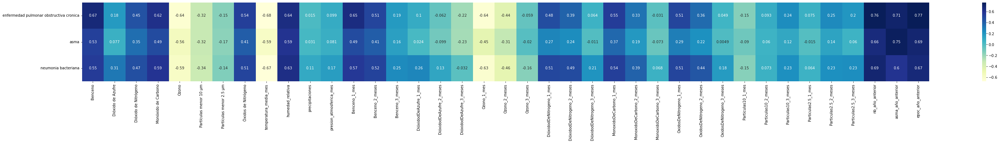

In [5]:
targets = ['enfermedad pulmonar obstructiva cronica', 'asma', 'neumonia bacteriana']

plt.subplots(figsize=(corr_df_def.shape[0]+10,4))
sns.heatmap(
    corr_df_def.loc[ 
        targets, 
        corr_df_def.columns[~ corr_df_def.columns.isin(targets)] 
    ], 
    cmap="YlGnBu",
    annot=True
)

## Modelos por número de ingresos totales

## XGBoost

In [ ]:
columns_X=['Benceno','Dióxido de Azufre','Dióxido de Nitrógeno','Monóxido de Carbono','Ozono','Partículas menor 10 μm','Partículas menor 2.5 μm','Óxidos de Nitrógeno',
	'Benceno_1_mes',	'Benceno_2_meses'	,'Benceno_3_meses',	'DióxidodDeAzufre_1_mes',	'DióxidodDeAzufre_2_meses',	'DióxidodDeAzufre_3_meses',	
    'Ozono_1_mes',	'Ozono_2_meses',	'Ozono_3_meses',	'DióxidodDeNitrogeno_1_mes',	'DióxidodDeNitrogeno_2_meses',	'DióxidodDeNitrogeno_3_meses',	
    'MonoxidoDeCarbono_1_mes',	'MonoxidoDeCarbono_2_meses',	'MonoxidoDeCarbono_3_meses',	'OxidosDeNitrogeno_1_mes',	'OxidosDeNitrogeno_2_meses',
    'OxidosDeNitrogeno_3_meses',	'Particulas10_1_mes',	'Particulas10_2_meses',	'Particulas10_3_meses','Particulas2.5_1_mes',	'Particulas2.5_2_meses',
    'Particulas2.5_3_meses','temperatura_media_mes','precipitaciones','presion_atmosferica_mes','humedad_relativa','ingresos_año_anterior','mes']
columns_y='numero_de_ingresos'
limite='2014-12-01'

X_train=df_def[ (~df_def[columns_y].isna()) & (df_def.fecha<=limite)][columns_X][12:]
y_train=df_def[ (~df_def[columns_y].isna()) & (df_def.fecha<=limite)][columns_y][12:]
X_test=df_def[ (~df_def[columns_y].isna()) & (df_def.fecha>limite)][columns_X]
y_test=df_def[ (~df_def[columns_y].isna()) & (df_def.fecha>limite)][columns_y]

In [ ]:
df_num_ingresos=df_def[['fecha','numero_de_ingresos']][12:]

In [ ]:
param_grid = {
    'n_estimators': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
model1=XGBRegressor()

In [ ]:
cv = RandomizedSearchCV(model1, param_grid, cv = 5, verbose = True, n_jobs = -1)

In [ ]:
cv.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predicto

In [ ]:
cv.best_score_,cv.best_params_

(0.056892713778877925,
 {'n_estimators': 20, 'max_depth': 2, 'learning_rate': 0.1})

In [ ]:
t = time.perf_counter()
final_model_xgb = XGBRegressor(**cv.best_params_)
final_model_xgb.fit(    X_train, y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[0]	validation_0-rmse:1376.27222	validation_1-rmse:1202.08350
[1]	validation_0-rmse:1244.27124	validation_1-rmse:1078.28394
[2]	validation_0-rmse:1125.39868	validation_1-rmse:968.81988
[3]	validation_0-rmse:1018.42377	validation_1-rmse:864.03644
[4]	validation_0-rmse:922.11359	validation_1-rmse:777.17322
[5]	validation_0-rmse:835.46838	validation_1-rmse:698.91858
[6]	validation_0-rmse:757.49493	validation_1-rmse:626.89752
[7]	validation_0-rmse:687.29944	validation_1-rmse:559.37750
[8]	validation_0-rmse:623.89130	validation_1-rmse:499.82922
[9]	validation_0-rmse:566.96173	validation_1-rmse:449.30252
[10]	validation_0-rmse:515.57159	validation_1-rmse:403.06570
[11]	validation_0-rmse:469.18732	validation_1-rmse:361.51892
[12]	validation_0-rmse:427.18091	validation_1-rmse:322.79504
[13]	validation_0-rmse:389.42032	validation_1-rmse:290.29547
[14]	validation_0-rmse:355.55405	validation_1-rmse:263.81668
[15]	validation_0-rmse:325.11661	validation_1-rmse:242.20784
[16]	validation_0-rmse:297.3

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=2, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=20, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.335305


Text(0.5, 1.0, 'Feature Importance')

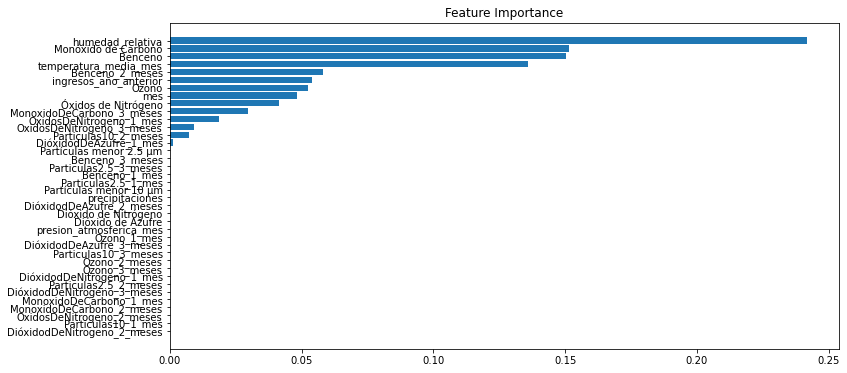

In [ ]:
feature_importance = final_model_xgb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

In [ ]:
preds0=final_model_xgb.predict(X_train)
preds1=final_model_xgb.predict(X_test)

In [ ]:
rmse_xgb_train,mae_xgb_train,mape_xgb_train=np.sqrt(mean_squared_error(preds0,y_train)),mean_absolute_error(preds0,y_train),mean_absolute_percentage_error(preds0,y_train)
rmse_xgb_test, mae_xgb_test,mape_xgb_test=np.sqrt(mean_squared_error(preds1,y_test)),mean_absolute_error(preds1,y_test),mean_absolute_percentage_error(preds1,y_test)

In [ ]:
errores_xgb_train=[ mae_xgb_train,mape_xgb_train,rmse_xgb_train]
errores_xgb_test=[ mae_xgb_test,mape_xgb_test,rmse_xgb_test]

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\core.py:105: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



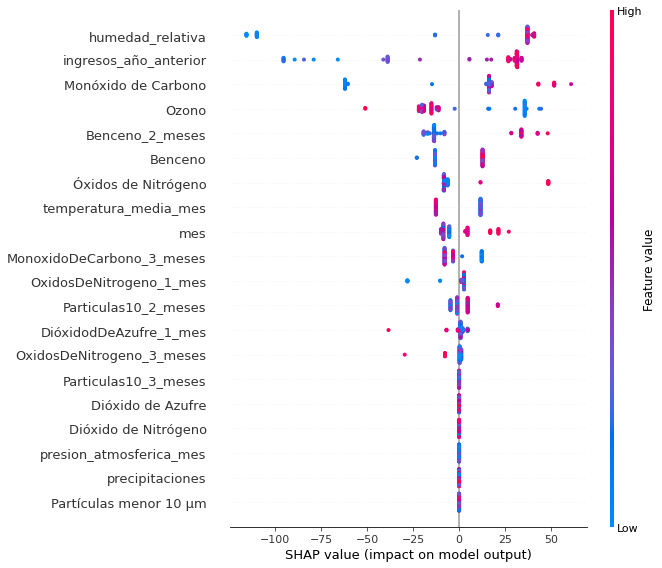

In [ ]:
explainer = shap.TreeExplainer(final_model_xgb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
df_num_ingresos['predicciones_xgb']=final_model_xgb.predict(pd.concat([X_train,X_test]).sort_index())

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



## CatBoost

In [ ]:
model2=CatBoostRegressor()

In [ ]:
param_grid = {
    'iterations': [10,20,30,40],
    'depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv = RandomizedSearchCV(model2, param_grid, cv = 5, verbose = True, n_jobs = -1)

In [ ]:
cv.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 271.8389535	total: 1.83ms	remaining: 71.6ms
1:	learn: 256.7431032	total: 3.67ms	remaining: 69.8ms
2:	learn: 246.5451062	total: 5.42ms	remaining: 66.9ms
3:	learn: 233.4665093	total: 6.83ms	remaining: 61.5ms
4:	learn: 225.1774519	total: 8.2ms	remaining: 57.4ms
5:	learn: 217.1344037	total: 9.67ms	remaining: 54.8ms
6:	learn: 209.1832187	total: 11.6ms	remaining: 54.7ms
7:	learn: 199.9326110	total: 13.2ms	remaining: 52.8ms
8:	learn: 193.6963549	total: 15.8ms	remaining: 54.3ms
9:	learn: 185.0447505	total: 17.3ms	remaining: 51.9ms
10:	learn: 177.9990918	total: 19.2ms	remaining: 50.7ms
11:	learn: 172.4506387	total: 20.9ms	remaining: 48.7ms
12:	learn: 166.6138907	total: 22.2ms	remaining: 46.2ms
13:	learn: 162.5025799	total: 24ms	remaining: 44.5ms
14:	learn: 157.1446712	total: 26.5ms	remaining: 44.1ms
15:	learn: 153.5034548	total: 27.8ms	remaining: 41.8ms
16:	learn: 147.9761555	total: 29.8ms	remaining: 40.3ms
17:	learn: 143.81

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x000001D990AA2640>,
                   n_jobs=-1,
                   param_distributions={'depth': [2, 3, 4, 5],
                                        'iterations': [10, 20, 30, 40],
                                        'learning_rate': [0.01, 0.001, 0.1]},
                   verbose=True)

In [ ]:
cv.best_score_,cv.best_params_

(0.6905865706390052, {'learning_rate': 0.1, 'iterations': 40, 'depth': 3})

In [ ]:
final_model_cb=CatBoostRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_cb.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)],early_stopping_rounds=5)

0:	learn: 271.8389535	test: 271.8389535	test1: 305.9235795	best: 305.9235795 (0)	total: 1.66ms	remaining: 64.8ms
1:	learn: 256.7431032	test: 256.7431032	test1: 288.9043593	best: 288.9043593 (1)	total: 3.19ms	remaining: 60.6ms
2:	learn: 246.5451062	test: 246.5451062	test1: 277.5159847	best: 277.5159847 (2)	total: 4.48ms	remaining: 55.2ms
3:	learn: 233.4665093	test: 233.4665093	test1: 267.8466473	best: 267.8466473 (3)	total: 7.95ms	remaining: 71.6ms
4:	learn: 225.1774519	test: 225.1774519	test1: 259.2081485	best: 259.2081485 (4)	total: 9.53ms	remaining: 66.7ms
5:	learn: 217.1344037	test: 217.1344037	test1: 251.8893847	best: 251.8893847 (5)	total: 11.5ms	remaining: 64.9ms
6:	learn: 209.1832187	test: 209.1832187	test1: 248.9509265	best: 248.9509265 (6)	total: 13ms	remaining: 61.5ms
7:	learn: 199.9326110	test: 199.9326110	test1: 242.6024219	best: 242.6024219 (7)	total: 14.6ms	remaining: 58.5ms
8:	learn: 193.6963549	test: 193.6963549	test1: 239.2290686	best: 239.2290686 (8)	total: 15.7ms	rem

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.359104


Text(0.5, 1.0, 'Feature Importance')

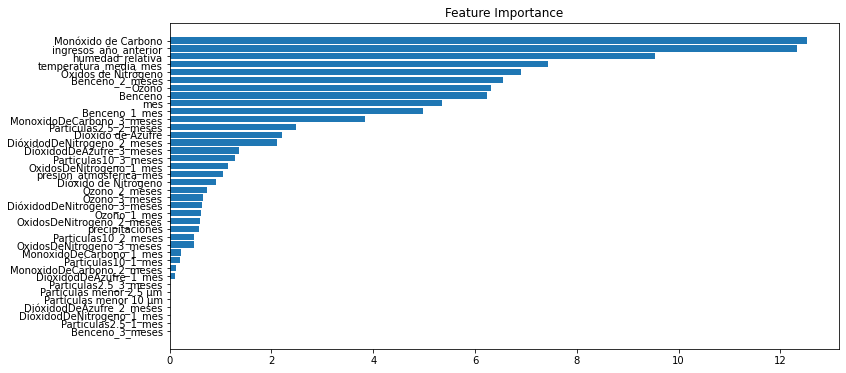

In [ ]:
feature_importance = final_model_cb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

In [ ]:
pred3=final_model_cb.predict(X_train)
pred2=final_model_cb.predict(X_test)

In [ ]:
mae_cb_train,mape_cb_train,rmse_cb_train=mean_absolute_error(pred3,y_train),mean_absolute_percentage_error(pred3,y_train),np.sqrt(mean_squared_error(pred3,y_train))
mae_cb_test,mape_cb_test,rmse_cb_test=mean_absolute_error(pred2,y_test),mean_absolute_percentage_error(pred2,y_test),np.sqrt(mean_squared_error(pred2,y_test))

In [ ]:
errores_cb_train=[mae_cb_train,mape_cb_train,rmse_cb_train]
errores_cb_test=[mae_cb_test,mape_cb_test,rmse_cb_test]

In [ ]:
errores_cb_test

[125.54378399022029, 0.09144070227156044, 190.72284899269494]

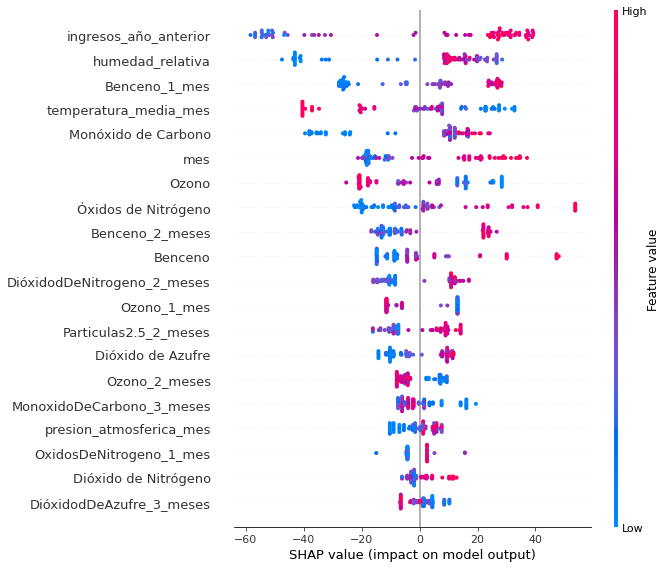

In [ ]:
explainer = shap.TreeExplainer(final_model_cb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
df_num_ingresos['predicciones_cb']=final_model_cb.predict(pd.concat([X_train,X_test]).sort_index())

## LightGBM

In [ ]:
model3=LGBMRegressor()

In [ ]:
param_grid = {
    'num_iterations': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model3,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.001, 0.1],
                                        'max_depth': [2, 3, 4, 5],
                                        'num_iterations': [10, 20, 30, 40]})

In [ ]:
cv.best_params_,cv.best_score_

({'num_iterations': 40, 'max_depth': 2, 'learning_rate': 0.1},
 0.6766577734768454)

In [ ]:
final_model_lgb=LGBMRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_lgb.fit(X_train,y_train, eval_set=[(X_train,y_train),(X_test,y_test)],early_stopping_rounds=5)

[1]	training's l2: 71310.9	valid_1's l2: 91014.6
[2]	training's l2: 62777.5	valid_1's l2: 80066.3
[3]	training's l2: 55574.7	valid_1's l2: 71587.5
[4]	training's l2: 49582.2	valid_1's l2: 64915.4
[5]	training's l2: 44450.4	valid_1's l2: 58556.6
[6]	training's l2: 40028.3	valid_1's l2: 54015.3
[7]	training's l2: 36288.2	valid_1's l2: 49498.9
[8]	training's l2: 33165.7	valid_1's l2: 46779.6
[9]	training's l2: 30482.5	valid_1's l2: 43795.4
[10]	training's l2: 28744.8	valid_1's l2: 42584.1
[11]	training's l2: 26651.6	valid_1's l2: 40101.8
[12]	training's l2: 25339.5	valid_1's l2: 39591.4
[13]	training's l2: 23340.4	valid_1's l2: 38357
[14]	training's l2: 22380.8	valid_1's l2: 37837.7
[15]	training's l2: 20829.9	valid_1's l2: 36962.4
[16]	training's l2: 19432	valid_1's l2: 36446.2
[17]	training's l2: 18292.5	valid_1's l2: 35787.4
[18]	training's l2: 17226.8	valid_1's l2: 34449.8
[19]	training's l2: 16293.7	valid_1's l2: 34202
[20]	training's l2: 15650.9	valid_1's l2: 33867.6
[21]	training's

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.



LGBMRegressor(max_depth=2, num_iterations=40)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.168311


Text(0.5, 1.0, 'Feature Importance')

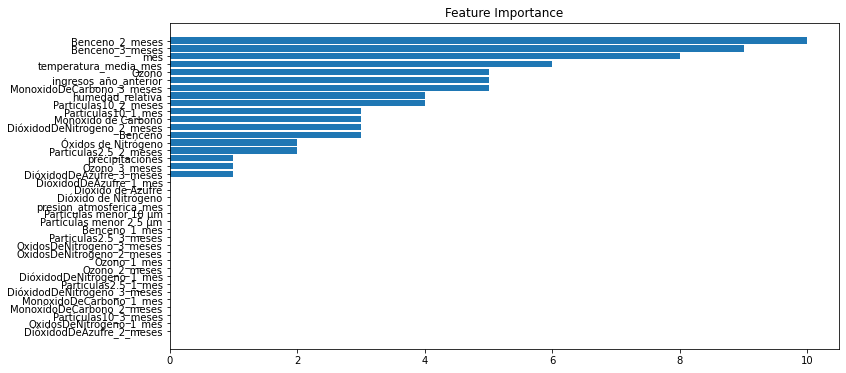

In [ ]:
feature_importance = final_model_lgb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

In [ ]:
pred5=final_model_lgb.predict(X_train)
pred4=final_model_lgb.predict(X_test)

In [ ]:
mae_lgb_train,mape_lgb_train,rmse_lgb_train=mean_absolute_error(pred5,y_train),mean_absolute_percentage_error(pred5,y_train),np.sqrt(mean_squared_error(pred5,y_train))
mae_lgb_test,mape_lgb_test,rmse_lgb_test=mean_absolute_error(pred4,y_test),mean_absolute_percentage_error(pred4,y_test),np.sqrt(mean_squared_error(pred4,y_test))

In [ ]:
errores_lgb_train=[mae_lgb_train,mape_lgb_train,rmse_lgb_train]
errores_lgb_test=[mae_lgb_test,mape_lgb_test,rmse_lgb_test]

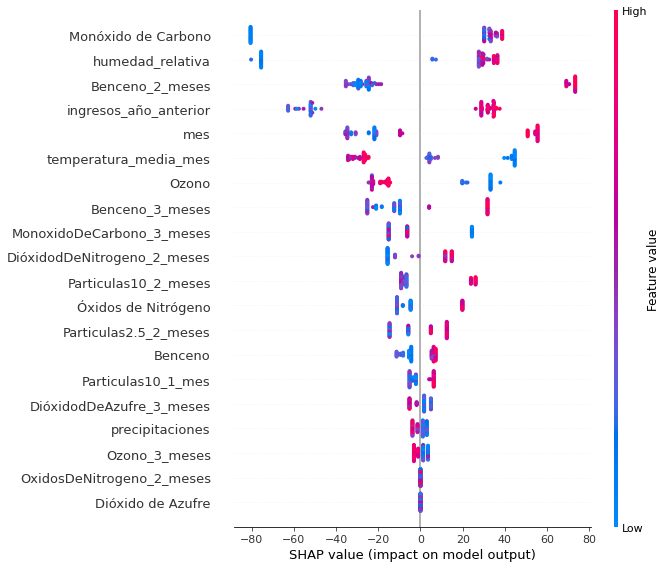

In [ ]:
explainer = shap.TreeExplainer(final_model_lgb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
df_errores_train=pd.DataFrame({'errores_xgb':errores_xgb_train,'errores_cb':errores_cb_train,'errores_lgb':errores_lgb_train},index=['MAE','MAPE','RMSE'])
df_errores_test=pd.DataFrame({'errores_xgb':errores_xgb_test,'errores_cb':errores_cb_test,'errores_lgb':errores_lgb_test},index=['MAE','MAPE','RMSE'])

In [ ]:
df_num_ingresos['predicciones_lgbm']=final_model_lgb.predict(pd.concat([X_train,X_test]).sort_index())

In [ ]:
px.line(df_num_ingresos,x='fecha',y=['predicciones_lgbm','predicciones_cb','predicciones_xgb','numero_de_ingresos'])

In [ ]:
df_errores_train

,errores_xgb,errores_cb,errores_lgb
MAE,198.509252,91.465904,72.148515
MAPE,0.148843,0.062702,0.049197
RMSE,230.028965,114.261438,98.252596


In [ ]:
df_errores_test

,errores_xgb,errores_cb,errores_lgb
MAE,161.101507,125.543784,123.481207
MAPE,0.132197,0.091441,0.089381
RMSE,185.757481,190.722849,171.921166


## Estimación por diagnosticos: Enfermedad pulmonar obstructiva crónica (epoc), asma (a) y neumonia bacteriana (nb)

## XGBoost para enfermedad pulmonar obstructiva cronica

In [ ]:
columns_X=['Benceno','Dióxido de Azufre','Dióxido de Nitrógeno','Monóxido de Carbono','Ozono','Partículas menor 10 μm','Partículas menor 2.5 μm','Óxidos de Nitrógeno',
	'Benceno_1_mes',	'Benceno_2_meses'	,'Benceno_3_meses',	'DióxidodDeAzufre_1_mes',	'DióxidodDeAzufre_2_meses',	'DióxidodDeAzufre_3_meses',	
    'Ozono_1_mes',	'Ozono_2_meses',	'Ozono_3_meses',	'DióxidodDeNitrogeno_1_mes',	'DióxidodDeNitrogeno_2_meses',	'DióxidodDeNitrogeno_3_meses',	
    'MonoxidoDeCarbono_1_mes',	'MonoxidoDeCarbono_2_meses',	'MonoxidoDeCarbono_3_meses',	'OxidosDeNitrogeno_1_mes',	'OxidosDeNitrogeno_2_meses',
    'OxidosDeNitrogeno_3_meses',	'Particulas10_1_mes',	'Particulas10_2_meses',	'Particulas10_3_meses','Particulas2.5_1_mes',	'Particulas2.5_2_meses',
    'Particulas2.5_3_meses','temperatura_media_mes','precipitaciones','presion_atmosferica_mes','humedad_relativa','epoc_año_anterior','mes']
columns_y='enfermedad pulmonar obstructiva cronica'

limite='2014-12-01'

X_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_X][12:]
y_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_y][12:]
X_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_X]
y_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_y]

In [ ]:
df_num_ingresos_epoc=df_def_diagnosticos[['fecha','enfermedad pulmonar obstructiva cronica']][12:]

In [ ]:
df_num_ingresos_epoc.dropna(inplace=True)

In [ ]:
model1=XGBRegressor()

In [ ]:
param_grid = {
    'n_estimators': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model1,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predicto

In [ ]:
cv.best_params_,cv.best_score_

({'n_estimators': 40, 'max_depth': 2, 'learning_rate': 0.1},
 0.7368925104438241)

In [ ]:
final_model_xgb_epoc=XGBRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_xgb_epoc.fit(    X_train, 
    y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[0]	validation_0-rmse:339.85477	validation_1-rmse:333.78744
[1]	validation_0-rmse:308.00766	validation_1-rmse:306.36966
[2]	validation_0-rmse:279.34311	validation_1-rmse:278.89127
[3]	validation_0-rmse:253.47954	validation_1-rmse:253.52049
[4]	validation_0-rmse:230.05032	validation_1-rmse:234.03780
[5]	validation_0-rmse:208.91702	validation_1-rmse:216.72694
[6]	validation_0-rmse:189.95369	validation_1-rmse:199.11549
[7]	validation_0-rmse:172.81406	validation_1-rmse:183.89542
[8]	validation_0-rmse:157.35950	validation_1-rmse:169.35648
[9]	validation_0-rmse:143.33839	validation_1-rmse:157.12795
[10]	validation_0-rmse:130.73286	validation_1-rmse:146.44812
[11]	validation_0-rmse:119.40372	validation_1-rmse:138.16925
[12]	validation_0-rmse:109.16757	validation_1-rmse:129.77875
[13]	validation_0-rmse:99.92493	validation_1-rmse:123.61547
[14]	validation_0-rmse:91.65957	validation_1-rmse:117.25516
[15]	validation_0-rmse:84.20630	validation_1-rmse:112.21864
[16]	validation_0-rmse:77.50388	valid

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=2, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=40, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.388130


Text(0.5, 1.0, 'Feature Importance')

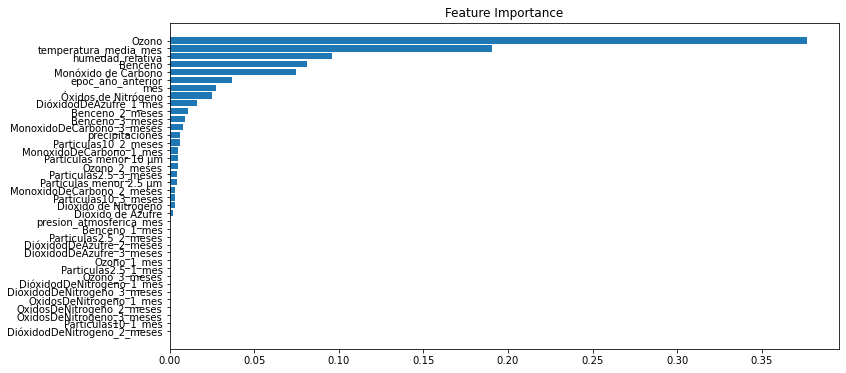

In [ ]:
feature_importance = final_model_xgb_epoc.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\core.py:105: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



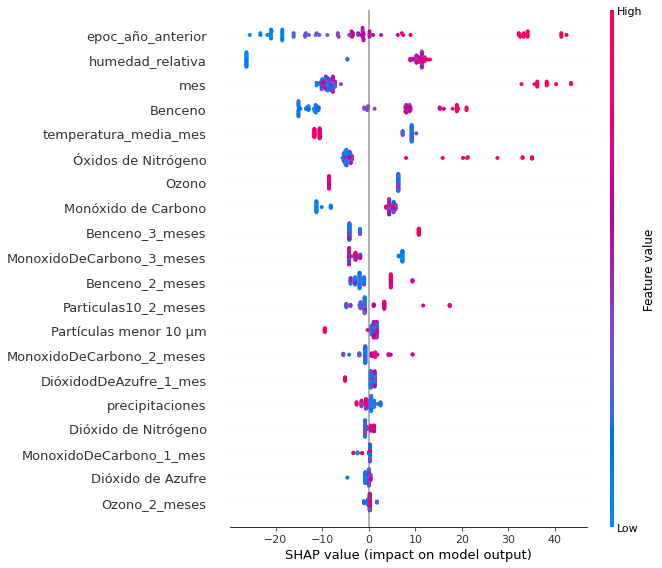

In [ ]:
explainer = shap.TreeExplainer(final_model_xgb_epoc)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred0_epoc=final_model_xgb_epoc.predict(X_train)
pred1_epoc=final_model_xgb_epoc.predict(X_test)

In [ ]:
mae_xgb_epoc_train,mape_xgb_epoc_train,rmse_xgb_epoc_train=mean_absolute_error(pred0_epoc,y_train),mean_absolute_percentage_error(pred0_epoc,y_train),np.sqrt(mean_squared_error(pred0_epoc,y_train))
mae_xgb_epoc_test,mape_xgb_epoc_test,rmse_xgb_epoc_test=mean_absolute_error(pred1_epoc,y_test),mean_absolute_percentage_error(pred1_epoc,y_test),np.sqrt(mean_squared_error(pred1_epoc,y_test))

In [ ]:
errores_xgb_epoc_train=[mae_xgb_epoc_train,mape_xgb_epoc_train,rmse_xgb_epoc_train]
errores_xgb_epoc_test=[mae_xgb_epoc_test,mape_xgb_epoc_test,rmse_xgb_epoc_test]

In [ ]:
df_num_ingresos_epoc['predicciones_xgb']=final_model_xgb_epoc.predict(pd.concat([X_train,X_test]).sort_index())

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



## Catboost para enfermedad pulmonar obstructiva cronica

In [ ]:
model2=CatBoostRegressor()

In [ ]:
param_grid = {
    'iterations': [10, 20,30,40],
    'depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model2,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

0:	learn: 96.2666430	total: 2.19ms	remaining: 41.5ms
1:	learn: 90.8723163	total: 3.67ms	remaining: 33.1ms
2:	learn: 87.6998565	total: 8.24ms	remaining: 46.7ms
3:	learn: 83.3724752	total: 11.3ms	remaining: 45ms
4:	learn: 79.2313888	total: 13.1ms	remaining: 39.3ms
5:	learn: 75.3171444	total: 14.6ms	remaining: 34.1ms
6:	learn: 72.4235966	total: 16.2ms	remaining: 30ms
7:	learn: 69.2491806	total: 18.6ms	remaining: 28ms
8:	learn: 67.1507029	total: 23.1ms	remaining: 28.3ms
9:	learn: 64.5035518	total: 25.1ms	remaining: 25.1ms
10:	learn: 61.3351277	total: 26.6ms	remaining: 21.7ms
11:	learn: 59.3025469	total: 27.8ms	remaining: 18.5ms
12:	learn: 57.4913064	total: 30.5ms	remaining: 16.4ms
13:	learn: 55.4387574	total: 32.1ms	remaining: 13.8ms
14:	learn: 53.4500185	total: 33.3ms	remaining: 11.1ms
15:	learn: 51.5006901	total: 38.2ms	remaining: 9.54ms
16:	learn: 49.8737042	total: 39.6ms	remaining: 6.99ms
17:	learn: 48.9532519	total: 41.1ms	remaining: 4.57ms
18:	learn: 47.6516514	total: 43.6ms	remainin

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x000001D992551130>,
                   n_jobs=-1,
                   param_distributions={'depth': [2, 3, 4, 5],
                                        'iterations': [10, 20, 30, 40],
                                        'learning_rate': [0.01, 0.001, 0.1]})

In [ ]:
cv.best_params_,cv.best_score_

({'learning_rate': 0.1, 'iterations': 20, 'depth': 3}, 0.6645737396605788)

In [ ]:
final_model_cb_epoc=CatBoostRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_cb_epoc.fit(X_train,y_train,eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

0:	learn: 96.2666430	test: 96.2666430	test1: 85.3325480	best: 85.3325480 (0)	total: 1.47ms	remaining: 27.9ms
1:	learn: 90.8723163	test: 90.8723163	test1: 80.3121430	best: 80.3121430 (1)	total: 2.38ms	remaining: 21.4ms
2:	learn: 87.6998565	test: 87.6998565	test1: 77.2753124	best: 77.2753124 (2)	total: 3.65ms	remaining: 20.7ms
3:	learn: 83.3724752	test: 83.3724752	test1: 73.7318308	best: 73.7318308 (3)	total: 4.98ms	remaining: 19.9ms
4:	learn: 79.2313888	test: 79.2313888	test1: 72.1086308	best: 72.1086308 (4)	total: 6.57ms	remaining: 19.7ms
5:	learn: 75.3171444	test: 75.3171444	test1: 70.3897134	best: 70.3897134 (5)	total: 8.04ms	remaining: 18.8ms
6:	learn: 72.4235966	test: 72.4235966	test1: 69.9406144	best: 69.9406144 (6)	total: 9.39ms	remaining: 17.4ms
7:	learn: 69.2491806	test: 69.2491806	test1: 68.0246807	best: 68.0246807 (7)	total: 10.9ms	remaining: 16.3ms
8:	learn: 67.1507029	test: 67.1507029	test1: 67.2227680	best: 67.2227680 (8)	total: 12.6ms	remaining: 15.4ms
9:	learn: 64.503551

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.340812


Text(0.5, 1.0, 'Feature Importance')

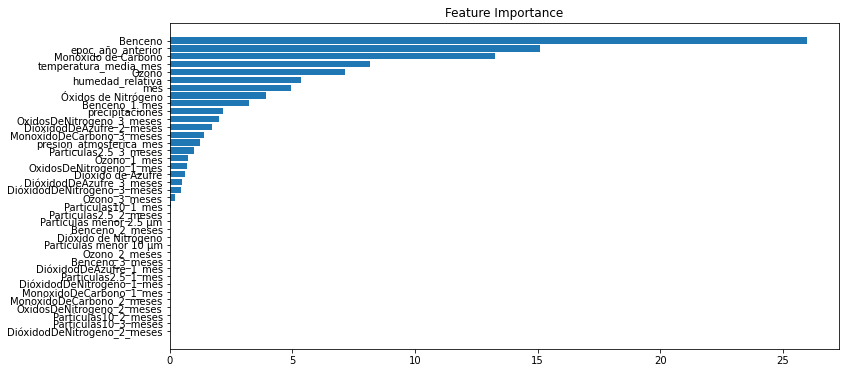

In [ ]:
feature_importance = final_model_cb_epoc.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

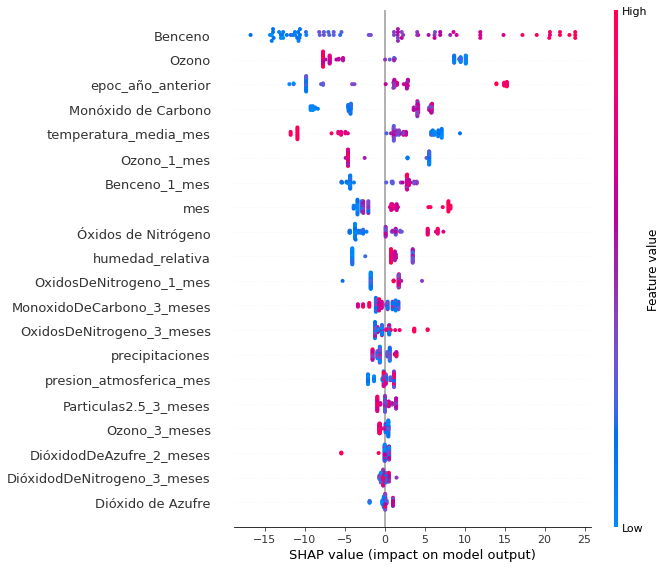

In [ ]:
explainer = shap.TreeExplainer(final_model_cb_epoc)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred3_epoc=final_model_cb_epoc.predict(X_train)
pred2_epoc=final_model_cb_epoc.predict(X_test)

In [ ]:
mae_cb_epoc_train,mape_cb_epoc_train,rmse_cb_epoc_train=mean_absolute_error(pred3_epoc,y_train),mean_absolute_percentage_error(pred3_epoc,y_train),np.sqrt(mean_squared_error(pred3_epoc,y_train))
mae_cb_epoc_test,mape_cb_epoc_test,rmse_cb_epoc_test=mean_absolute_error(pred2_epoc,y_test),mean_absolute_percentage_error(pred2_epoc,y_test),np.sqrt(mean_squared_error(pred2_epoc,y_test))

In [ ]:
errores_cb_epoc_train=[mae_cb_epoc_train,mape_cb_epoc_train,rmse_cb_epoc_train]
errores_cb_epoc_test=[mae_cb_epoc_test,mape_cb_epoc_test,rmse_cb_epoc_test]

In [ ]:
df_num_ingresos_epoc['predicciones_cb']=final_model_cb_epoc.predict(pd.concat([X_train,X_test]).sort_index())

## LightGBM para enfermedad pulmonar obstructiva cronica

In [ ]:
model3=LGBMRegressor()

In [ ]:
param_grid = {
    'num_iterations': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model3,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.001, 0.1],
                                        'max_depth': [2, 3, 4, 5],
                                        'num_iterations': [10, 20, 30, 40]})

In [ ]:
cv.best_params_,cv.best_score_

({'num_iterations': 30, 'max_depth': 5, 'learning_rate': 0.1},
 0.7013716454302397)

In [ ]:
final_model_lgb_epoc=LGBMRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_lgb_epoc.fit(X_train,y_train,  
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[1]	training's l2: 9183.55	valid_1's l2: 7070.94
[2]	training's l2: 8298.04	valid_1's l2: 6504.16
[3]	training's l2: 7555.57	valid_1's l2: 5898.99
[4]	training's l2: 6921.81	valid_1's l2: 5516.56
[5]	training's l2: 6113.57	valid_1's l2: 5253.69
[6]	training's l2: 5450.13	valid_1's l2: 5096.87
[7]	training's l2: 4913.77	valid_1's l2: 4787.28
[8]	training's l2: 4477.3	valid_1's l2: 4519.12
[9]	training's l2: 4083.71	valid_1's l2: 4423.59
[10]	training's l2: 3749.84	valid_1's l2: 4497.74
[11]	training's l2: 3453.62	valid_1's l2: 4448.23
[12]	training's l2: 3215.32	valid_1's l2: 4466.74
[13]	training's l2: 3070.88	valid_1's l2: 4442.13
[14]	training's l2: 2846.6	valid_1's l2: 4336.26
[15]	training's l2: 2658.73	valid_1's l2: 4191.62
[16]	training's l2: 2513.67	valid_1's l2: 4222.42
[17]	training's l2: 2376.53	valid_1's l2: 4173.92
[18]	training's l2: 2250.73	valid_1's l2: 4098.76
[19]	training's l2: 2155.66	valid_1's l2: 4172.95
[20]	training's l2: 2059.43	valid_1's l2: 4149.97
[21]	traini

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.



LGBMRegressor(max_depth=5, num_iterations=30)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.151243


Text(0.5, 1.0, 'Feature Importance')

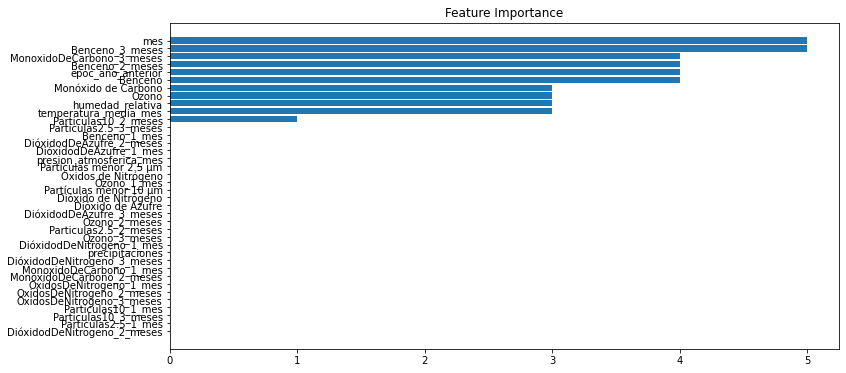

In [ ]:
feature_importance = final_model_lgb_epoc.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

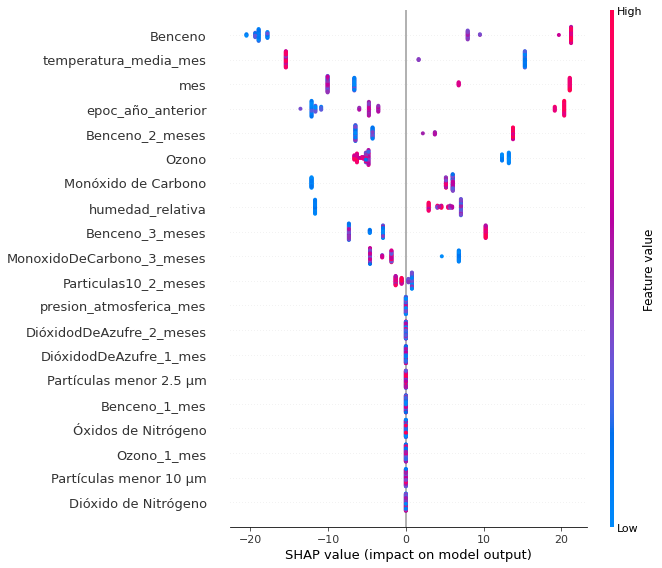

In [ ]:
explainer = shap.TreeExplainer(final_model_lgb_epoc)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred5_epoc=final_model_lgb_epoc.predict(X_train)
pred4_epoc=final_model_lgb_epoc.predict(X_test)

In [ ]:
mae_lgb_epoc_train,mape_lgb_epoc_train,rmse_lgb_epoc_train=mean_absolute_error(pred5_epoc,y_train),mean_absolute_percentage_error(pred5_epoc,y_train),np.sqrt(mean_squared_error(pred5_epoc,y_train))
mae_lgb_epoc_test,mape_lgb_epoc_test,rmse_lgb_epoc_test=mean_absolute_error(pred4_epoc,y_test),mean_absolute_percentage_error(pred4_epoc,y_test),np.sqrt(mean_squared_error(pred4_epoc,y_test))

In [ ]:
errores_lgb_epoc_train=[mae_lgb_epoc_train,mape_lgb_epoc_train,rmse_lgb_epoc_train]
errores_lgb_epoc_test=[mae_lgb_epoc_test,mape_lgb_epoc_test,rmse_lgb_epoc_test]

In [ ]:
df_errores_epoc_train=pd.DataFrame({'errores_xgb_epoc':errores_xgb_epoc_train,'errores_cb_epoc':errores_cb_epoc_train,'errores_lgb_epoc':errores_lgb_epoc_train},index=['MAE','MAPE','RMSE'])
df_errores_epoc_test=pd.DataFrame({'errores_xgb_epoc':errores_xgb_epoc_test,'errores_cb_epoc':errores_cb_epoc_test,'errores_lgb_epoc':errores_lgb_epoc_test},index=['MAE','MAPE','RMSE'])

In [ ]:
df_errores_epoc_train

,errores_xgb_epoc,errores_cb_epoc,errores_lgb_epoc
MAE,19.402091,45.438195,31.008279
MAPE,0.054914,0.127107,0.086168
RMSE,25.994048,57.491306,43.575325


In [ ]:
df_errores_epoc_test

,errores_xgb_epoc,errores_cb_epoc,errores_lgb_epoc
MAE,70.715869,54.698589,57.097230
MAPE,0.209725,0.151695,0.162759
RMSE,81.829945,65.398923,63.538265


In [ ]:
df_num_ingresos_epoc['predicciones_lgbm']=final_model_lgb_epoc.predict(pd.concat([X_train,X_test]).sort_index())

In [ ]:
px.line(df_num_ingresos_epoc,x='fecha',y=['enfermedad pulmonar obstructiva cronica','predicciones_xgb',	'predicciones_cb',	'predicciones_lgbm'])

## XGBoost para neumonia bacteriana

In [ ]:
columns_X=['Benceno','Dióxido de Azufre','Dióxido de Nitrógeno','Monóxido de Carbono','Ozono','Partículas menor 10 μm','Partículas menor 2.5 μm','Óxidos de Nitrógeno',
	'Benceno_1_mes',	'Benceno_2_meses'	,'Benceno_3_meses',	'DióxidodDeAzufre_1_mes',	'DióxidodDeAzufre_2_meses',	'DióxidodDeAzufre_3_meses',	
    'Ozono_1_mes',	'Ozono_2_meses',	'Ozono_3_meses',	'DióxidodDeNitrogeno_1_mes',	'DióxidodDeNitrogeno_2_meses',	'DióxidodDeNitrogeno_3_meses',	
    'MonoxidoDeCarbono_1_mes',	'MonoxidoDeCarbono_2_meses',	'MonoxidoDeCarbono_3_meses',	'OxidosDeNitrogeno_1_mes',	'OxidosDeNitrogeno_2_meses',
    'OxidosDeNitrogeno_3_meses',	'Particulas10_1_mes',	'Particulas10_2_meses',	'Particulas10_3_meses','Particulas2.5_1_mes',	'Particulas2.5_2_meses',
    'Particulas2.5_3_meses','temperatura_media_mes','precipitaciones','presion_atmosferica_mes','humedad_relativa','nb_año_anterior','mes']
columns_y='neumonia bacteriana'

limite='2014-12-01'

X_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_X][12:]
y_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_y][12:]
X_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_X]
y_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_y]

In [ ]:
df_num_ingresos_nb=df_def_diagnosticos[['fecha','neumonia bacteriana']][12:]

In [ ]:
df_num_ingresos_nb.dropna(inplace=True)

In [ ]:
model1=XGBRegressor()

In [ ]:
param_grid = {
    'n_estimators': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model1,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predicto

In [ ]:
cv.best_params_,cv.best_score_

({'n_estimators': 30, 'max_depth': 3, 'learning_rate': 0.1},
 0.5716415783657098)

In [ ]:
final_model_xgb_nb=XGBRegressor(random_state=42, min_sample_split = 20,**cv.best_params_)
t=time.perf_counter()
final_model_xgb_nb.fit(    X_train, 
    y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[13:34:02] WARNING: D:\bld\xgboost-split_1645118015404\work\src\learner.cc:576: 
Parameters: { "min_sample_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-rmse:193.28981	validation_1-rmse:187.35725
[1]	validation_0-rmse:175.09688	validation_1-rmse:171.28468
[2]	validation_0-rmse:158.75867	validation_1-rmse:156.84717
[3]	validation_0-rmse:144.05368	validation_1-rmse:142.95969
[4]	validation_0-rmse:130.83756	validation_1-rmse:130.96960
[5]	validation_0-rmse:118.93436	validation_1-rmse:120.17609
[6]	validation_0-rmse:108.19617	validation_1-rmse:111.32029
[7]	validation_0-rmse:98.52198	validation_1-rmse:103.21738
[8]	validation_0-rmse:89.79227	validation_1-rmse:94.38540
[9]	validation_0-rmse:81.92034	validation_1-rmse:88.60976
[

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, min_sample_split=20, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.300217


Text(0.5, 1.0, 'Feature Importance')

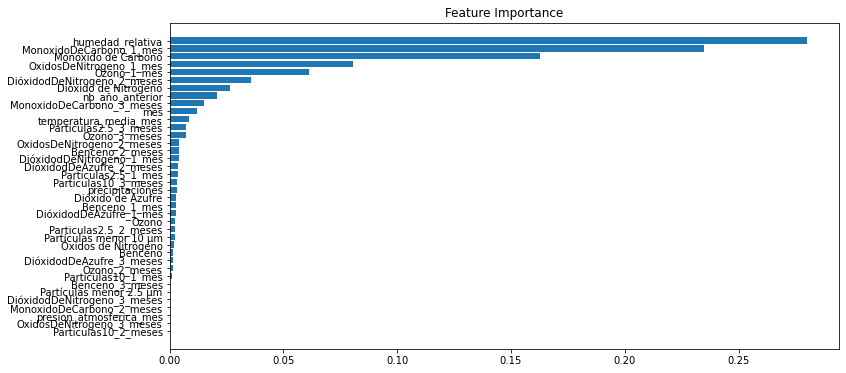

In [ ]:
feature_importance = final_model_xgb_nb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\core.py:105: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



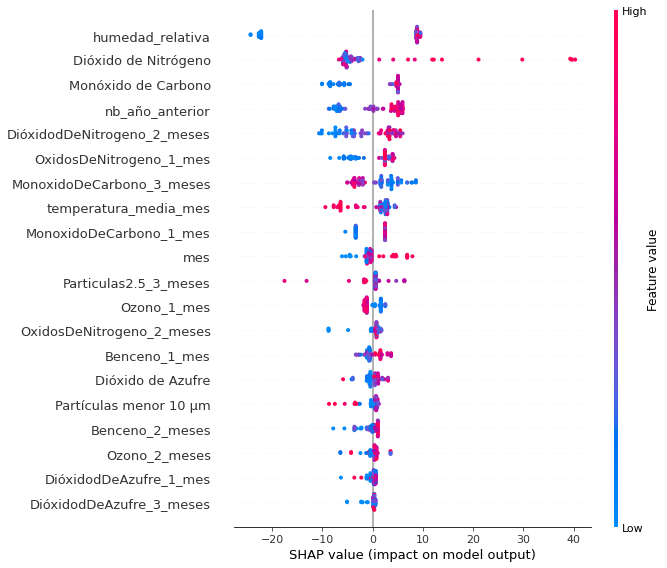

In [ ]:
explainer = shap.TreeExplainer(final_model_xgb_nb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred0_nb=final_model_xgb_nb.predict(X_train)
pred1_nb=final_model_xgb_nb.predict(X_test)

In [ ]:
mae_xgb_nb_train,mape_xgb_nb_train,rmse_xgb_nb_train=mean_absolute_error(pred0_nb,y_train),mean_absolute_percentage_error(pred0_nb,y_train),np.sqrt(mean_squared_error(pred0_nb,y_train))
mae_xgb_nb_test,mape_xgb_nb_test,rmse_xgb_nb_test=mean_absolute_error(pred1_nb,y_test),mean_absolute_percentage_error(pred1_nb,y_test),np.sqrt(mean_squared_error(pred1_nb,y_test))

In [ ]:
errores_xgb_nb_train=[mae_xgb_nb_train,mape_xgb_nb_train,rmse_xgb_nb_train]
errores_xgb_nb_test=[mae_xgb_nb_test,mape_xgb_nb_test,rmse_xgb_nb_test]

In [ ]:
df_num_ingresos_nb['predicciones_xgb']=final_model_xgb_nb.predict(pd.concat([X_train,X_test]).sort_index())

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



## Catboost para neumonia bacteriana

In [ ]:
model2=CatBoostRegressor()

In [ ]:
param_grid = {
    'iterations': [10, 20,30,40],
    'depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model2,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

0:	learn: 53.0888672	total: 3.42ms	remaining: 133ms
1:	learn: 50.8616477	total: 7.02ms	remaining: 133ms
2:	learn: 48.6027458	total: 13.1ms	remaining: 162ms
3:	learn: 46.7149816	total: 16.9ms	remaining: 152ms
4:	learn: 44.3762423	total: 21.1ms	remaining: 148ms
5:	learn: 42.5959815	total: 24.9ms	remaining: 141ms
6:	learn: 41.2324079	total: 27.8ms	remaining: 131ms
7:	learn: 39.4887362	total: 30ms	remaining: 120ms
8:	learn: 38.1969668	total: 33.6ms	remaining: 116ms
9:	learn: 37.1136467	total: 36.4ms	remaining: 109ms
10:	learn: 35.8992766	total: 40.7ms	remaining: 107ms
11:	learn: 34.5201802	total: 47.3ms	remaining: 110ms
12:	learn: 33.3187147	total: 50.3ms	remaining: 105ms
13:	learn: 32.3133396	total: 53ms	remaining: 98.4ms
14:	learn: 31.1382866	total: 56ms	remaining: 93.4ms
15:	learn: 30.2344692	total: 59ms	remaining: 88.5ms
16:	learn: 29.3693052	total: 62.5ms	remaining: 84.5ms
17:	learn: 28.5303280	total: 66.4ms	remaining: 81.1ms
18:	learn: 27.7361873	total: 70ms	remaining: 77.4ms
19:	lea

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x000001D99290ED60>,
                   n_jobs=-1,
                   param_distributions={'depth': [2, 3, 4, 5],
                                        'iterations': [10, 20, 30, 40],
                                        'learning_rate': [0.01, 0.001, 0.1]})

In [ ]:
cv.best_params_,cv.best_score_

({'learning_rate': 0.1, 'iterations': 40, 'depth': 4}, 0.6219204552286052)

In [ ]:
final_model_cb_nb=CatBoostRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_cb_nb.fit(X_train,y_train,eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

0:	learn: 53.0888672	test: 53.0888672	test1: 54.8469132	best: 54.8469132 (0)	total: 2.01ms	remaining: 78.3ms
1:	learn: 50.8616477	test: 50.8616477	test1: 52.2934989	best: 52.2934989 (1)	total: 3.52ms	remaining: 67ms
2:	learn: 48.6027458	test: 48.6027458	test1: 50.0095033	best: 50.0095033 (2)	total: 5.22ms	remaining: 64.4ms
3:	learn: 46.7149816	test: 46.7149816	test1: 47.9596231	best: 47.9596231 (3)	total: 7.03ms	remaining: 63.3ms
4:	learn: 44.3762423	test: 44.3762423	test1: 46.3335178	best: 46.3335178 (4)	total: 8.64ms	remaining: 60.5ms
5:	learn: 42.5959815	test: 42.5959815	test1: 44.8402055	best: 44.8402055 (5)	total: 10.2ms	remaining: 57.7ms
6:	learn: 41.2324079	test: 41.2324079	test1: 43.8147169	best: 43.8147169 (6)	total: 11.5ms	remaining: 54.2ms
7:	learn: 39.4887362	test: 39.4887362	test1: 42.7812975	best: 42.7812975 (7)	total: 12.9ms	remaining: 51.5ms
8:	learn: 38.1969668	test: 38.1969668	test1: 42.5999651	best: 42.5999651 (8)	total: 14.3ms	remaining: 49.3ms
9:	learn: 37.1136467	

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.210260


Text(0.5, 1.0, 'Feature Importance')

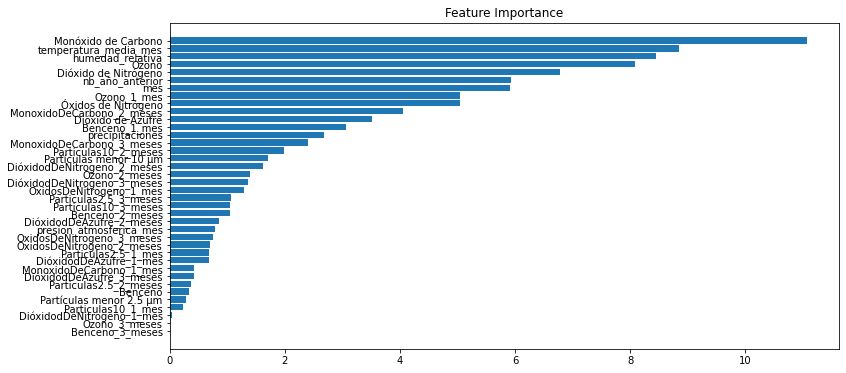

In [ ]:
feature_importance = final_model_cb_nb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

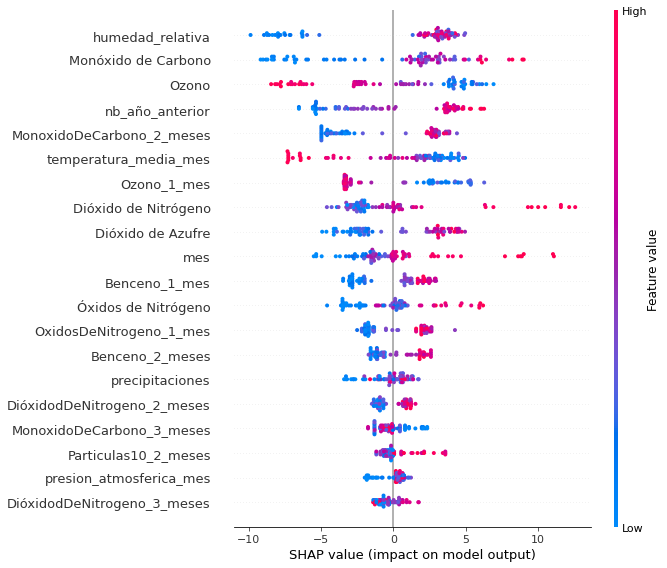

In [ ]:
explainer = shap.TreeExplainer(final_model_cb_nb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred3_nb=final_model_cb_nb.predict(X_train)
pred2_nb=final_model_cb_nb.predict(X_test)

In [ ]:
mae_cb_nb_train,mape_cb_nb_train,rmse_cb_nb_train=mean_absolute_error(pred3_nb,y_train),mean_absolute_percentage_error(pred3_nb,y_train),np.sqrt(mean_squared_error(pred3_nb,y_train))
mae_cb_nb_test,mape_cb_nb_test,rmse_cb_nb_test=mean_absolute_error(pred2_nb,y_test),mean_absolute_percentage_error(pred2_nb,y_test),np.sqrt(mean_squared_error(pred2_nb,y_test))

In [ ]:
errores_cb_nb_train=[mae_cb_nb_train,mape_cb_nb_train,rmse_cb_nb_train]
errores_cb_nb_test=[mae_cb_nb_test,mape_cb_nb_test,rmse_cb_nb_test]

In [ ]:
df_num_ingresos_nb['predicciones_cb']=final_model_cb_nb.predict(pd.concat([X_train,X_test]).sort_index())

## LightGBM para neumonia bacteriana

In [ ]:
model3=LGBMRegressor()

In [ ]:
param_grid = {
    'num_iterations': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model3,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.001, 0.1],
                                        'max_depth': [2, 3, 4, 5],
                                        'num_iterations': [10, 20, 30, 40]})

In [ ]:
cv.best_params_,cv.best_score_

({'num_iterations': 10, 'max_depth': 4, 'learning_rate': 0.1},
 0.3594539411960701)

In [ ]:
final_model_lgb_nb=LGBMRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_lgb_nb.fit(X_train,y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[1]	training's l2: 2697.65	valid_1's l2: 2782.09
[2]	training's l2: 2395.14	valid_1's l2: 2490.5
[3]	training's l2: 2164.97	valid_1's l2: 2287.63
[4]	training's l2: 1952.38	valid_1's l2: 2057.39
[5]	training's l2: 1776.27	valid_1's l2: 1911.26
[6]	training's l2: 1624.93	valid_1's l2: 1811.44
[7]	training's l2: 1500.08	valid_1's l2: 1727.13
[8]	training's l2: 1383.67	valid_1's l2: 1630.59
[9]	training's l2: 1278.88	valid_1's l2: 1623.45
[10]	training's l2: 1191.35	valid_1's l2: 1610.75


c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.



LGBMRegressor(max_depth=4, num_iterations=10)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.211404


Text(0.5, 1.0, 'Feature Importance')

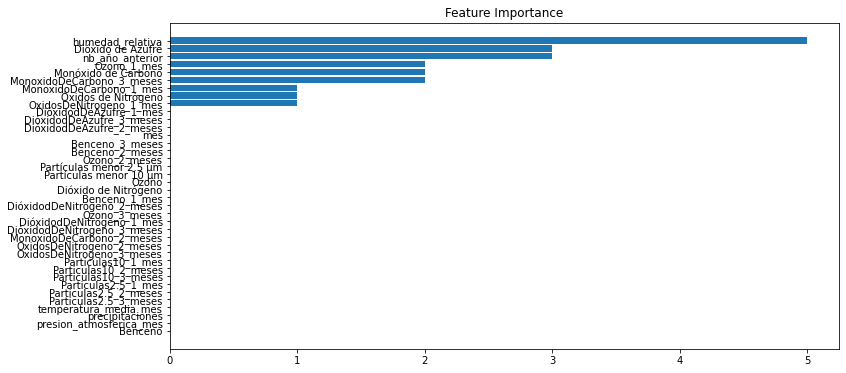

In [ ]:
feature_importance = final_model_lgb_nb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

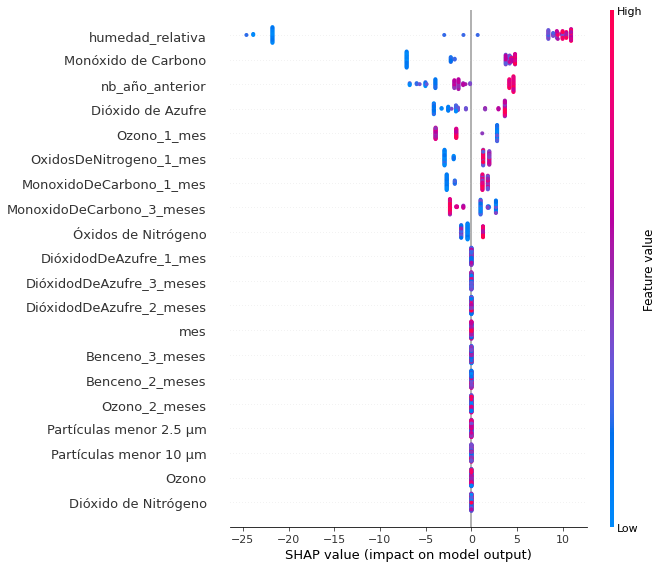

In [ ]:
explainer = shap.TreeExplainer(final_model_lgb_nb)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred5_nb=final_model_lgb_nb.predict(X_train)
pred4_nb=final_model_lgb_nb.predict(X_test)

In [ ]:
mae_lgb_nb_train,mape_lgb_nb_train,rmse_lgb_nb_train=mean_absolute_error(pred5_nb,y_train),mean_absolute_percentage_error(pred5_nb,y_train),np.sqrt(mean_squared_error(pred5_nb,y_train))
mae_lgb_nb_test,mape_lgb_nb_test,rmse_lgb_nb_test=mean_absolute_error(pred4_nb,y_test),mean_absolute_percentage_error(pred4_nb,y_test),np.sqrt(mean_squared_error(pred4_nb,y_test))

In [ ]:
errores_lgb_nb_train=[mae_lgb_nb_train,mape_lgb_nb_train,rmse_lgb_nb_train]
errores_lgb_nb_test=[mae_lgb_nb_test,mape_lgb_nb_test,rmse_lgb_nb_test]

In [ ]:
df_errores_nb_train=pd.DataFrame({'errores_xgb_nb':errores_xgb_nb_train,'errores_cb_nb':errores_cb_nb_train,'errores_lgb_nb':errores_lgb_nb_train},index=['MAE','MAPE','RMSE'])
df_errores_nb_test=pd.DataFrame({'errores_xgb_nb':errores_xgb_nb_test,'errores_cb_nb':errores_cb_nb_test,'errores_lgb_nb':errores_lgb_nb_test},index=['MAE','MAPE','RMSE'])

In [ ]:
df_errores_nb_train

,errores_xgb_nb,errores_cb_nb,errores_lgb_nb
MAE,12.200260,15.503103,24.672433
MAPE,0.058975,0.075587,0.121184
RMSE,16.451457,20.720178,34.516004


In [ ]:
df_errores_nb_test

,errores_xgb_nb,errores_cb_nb,errores_lgb_nb
MAE,35.654232,26.505421,36.361972
MAPE,0.193363,0.132368,0.190592
RMSE,42.246610,31.822982,40.134130


In [ ]:
df_num_ingresos_nb['predicciones_lgbm']=final_model_lgb_nb.predict(pd.concat([X_train,X_test]).sort_index())

In [ ]:
px.line(df_num_ingresos_nb,x='fecha',y=['neumonia bacteriana','predicciones_lgbm','predicciones_cb','predicciones_xgb'])

## XGBoost para asma

In [ ]:
columns_X=['Benceno','Dióxido de Azufre','Dióxido de Nitrógeno','Monóxido de Carbono','Ozono','Partículas menor 10 μm','Partículas menor 2.5 μm','Óxidos de Nitrógeno',
	'Benceno_1_mes',	'Benceno_2_meses'	,'Benceno_3_meses',	'DióxidodDeAzufre_1_mes',	'DióxidodDeAzufre_2_meses',	'DióxidodDeAzufre_3_meses',	
    'Ozono_1_mes',	'Ozono_2_meses',	'Ozono_3_meses',	'DióxidodDeNitrogeno_1_mes',	'DióxidodDeNitrogeno_2_meses',	'DióxidodDeNitrogeno_3_meses',	
    'MonoxidoDeCarbono_1_mes',	'MonoxidoDeCarbono_2_meses',	'MonoxidoDeCarbono_3_meses',	'OxidosDeNitrogeno_1_mes',	'OxidosDeNitrogeno_2_meses',
    'OxidosDeNitrogeno_3_meses',	'Particulas10_1_mes',	'Particulas10_2_meses',	'Particulas10_3_meses','Particulas2.5_1_mes',	'Particulas2.5_2_meses',
    'Particulas2.5_3_meses','temperatura_media_mes','precipitaciones','presion_atmosferica_mes','humedad_relativa','asma_año_anterior','mes']
columns_y='asma'


limite='2014-12-01'

X_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_X][12:]
y_train=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha<=limite)][columns_y][12:]
X_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_X][:12]
y_test=df_def_diagnosticos[ (~df_def_diagnosticos[columns_y].isna()) & (df_def_diagnosticos.fecha>limite)][columns_y][:12]

In [ ]:
df_num_ingresos_a=df_def_diagnosticos[['fecha','asma']][13:]

In [ ]:
df_num_ingresos_a.dropna(inplace=True)

In [ ]:
model1=XGBRegressor()

In [ ]:
param_grid = {
    'n_estimators': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model1,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predicto

In [ ]:
cv.best_params_,cv.best_score_

({'n_estimators': 30, 'max_depth': 3, 'learning_rate': 0.1},
 0.36774335719267426)

In [ ]:
final_model_xgb_a=XGBRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_xgb_a.fit(    X_train, 
    y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[0]	validation_0-rmse:102.63670	validation_1-rmse:101.68776
[1]	validation_0-rmse:93.28649	validation_1-rmse:93.44647
[2]	validation_0-rmse:84.87162	validation_1-rmse:85.40485
[3]	validation_0-rmse:77.27734	validation_1-rmse:78.55138
[4]	validation_0-rmse:70.46463	validation_1-rmse:73.00892
[5]	validation_0-rmse:64.30842	validation_1-rmse:67.08165
[6]	validation_0-rmse:58.75795	validation_1-rmse:62.86649
[7]	validation_0-rmse:53.74383	validation_1-rmse:58.49561
[8]	validation_0-rmse:49.19364	validation_1-rmse:54.38112
[9]	validation_0-rmse:45.05809	validation_1-rmse:50.89916
[10]	validation_0-rmse:41.32550	validation_1-rmse:47.82272
[11]	validation_0-rmse:37.96314	validation_1-rmse:45.62189
[12]	validation_0-rmse:34.92001	validation_1-rmse:42.20134
[13]	validation_0-rmse:32.18147	validation_1-rmse:40.10691
[14]	validation_0-rmse:29.67667	validation_1-rmse:37.76772
[15]	validation_0-rmse:27.43517	validation_1-rmse:36.44691
[16]	validation_0-rmse:25.41928	validation_1-rmse:34.22242
[17]	

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.283896


Text(0.5, 1.0, 'Feature Importance')

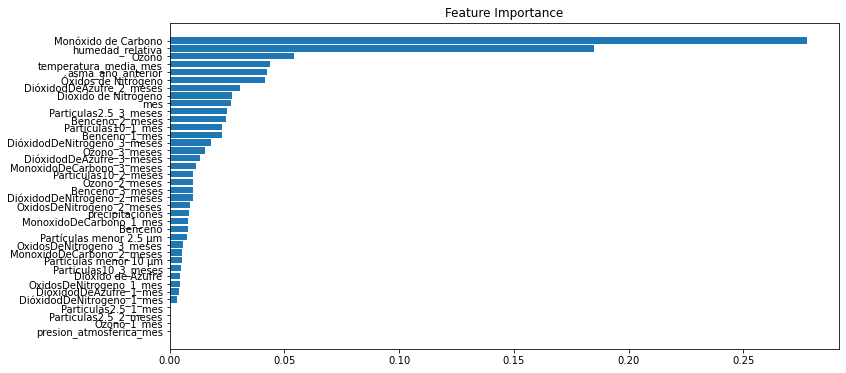

In [ ]:
feature_importance = final_model_xgb_a.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\core.py:105: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



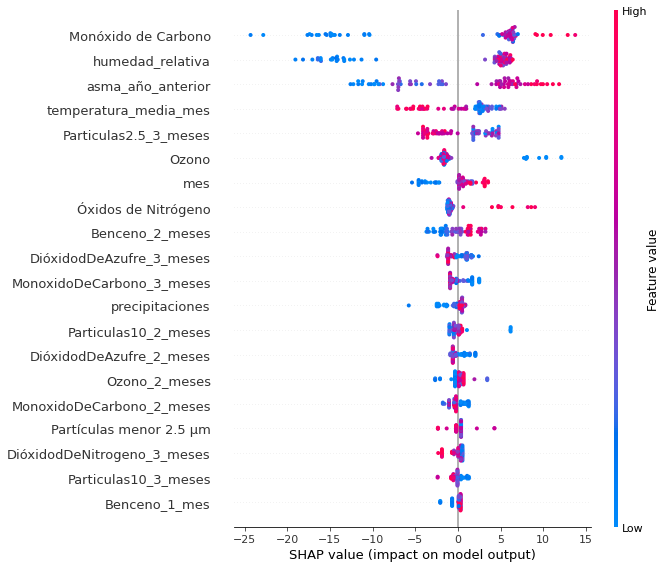

In [ ]:
explainer = shap.TreeExplainer(final_model_xgb_a)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred0_a=final_model_xgb_a.predict(X_train)
pred1_a=final_model_xgb_a.predict(X_test)

In [ ]:
mae_xgb_a_train,mape_xgb_a_train,rmse_xgb_a_train=mean_absolute_error(pred0_a,y_train),mean_absolute_percentage_error(pred0_a,y_train),np.sqrt(mean_squared_error(pred0_a,y_train))
mae_xgb_a_test,mape_xgb_a_test,rmse_xgb_a_test=mean_absolute_error(pred1_a,y_test),mean_absolute_percentage_error(pred1_a,y_test),np.sqrt(mean_squared_error(pred1_a,y_test))

In [ ]:
errores_xgb_a_train=[mae_xgb_a_train,mape_xgb_a_train,rmse_xgb_a_train]
errores_xgb_a_test=[mae_xgb_a_test,mape_xgb_a_test,rmse_xgb_a_test]

In [ ]:
df_num_ingresos_a['predicciones_xgb']=final_model_xgb_a.predict(pd.concat([X_train,X_test]).sort_index())

c:\Users\carlo\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



## CatBoost para asma

In [ ]:
model2=CatBoostRegressor()

In [ ]:
param_grid = {
    'iterations': [10, 20,30,40],
    'depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model2,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

0:	learn: 37.4344656	total: 3.5ms	remaining: 66.6ms
1:	learn: 35.8845607	total: 5.68ms	remaining: 51.2ms
2:	learn: 34.6800082	total: 7.74ms	remaining: 43.9ms
3:	learn: 33.1942170	total: 11.1ms	remaining: 44.4ms
4:	learn: 31.8882923	total: 13.3ms	remaining: 39.8ms
5:	learn: 30.4507918	total: 15.3ms	remaining: 35.7ms
6:	learn: 29.5965133	total: 17.5ms	remaining: 32.5ms
7:	learn: 28.7727167	total: 19.8ms	remaining: 29.7ms
8:	learn: 28.1487175	total: 22.1ms	remaining: 27ms
9:	learn: 27.4073360	total: 24.8ms	remaining: 24.8ms
10:	learn: 26.6616273	total: 26.8ms	remaining: 21.9ms
11:	learn: 25.8292592	total: 29.1ms	remaining: 19.4ms
12:	learn: 25.2100510	total: 37.8ms	remaining: 20.3ms
13:	learn: 24.4761326	total: 40.8ms	remaining: 17.5ms
14:	learn: 23.7422758	total: 43ms	remaining: 14.3ms
15:	learn: 23.4258822	total: 45.3ms	remaining: 11.3ms
16:	learn: 23.0132009	total: 47.5ms	remaining: 8.38ms
17:	learn: 22.5702358	total: 49.6ms	remaining: 5.51ms
18:	learn: 22.1202207	total: 51.7ms	remaini

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x000001D992380370>,
                   n_jobs=-1,
                   param_distributions={'depth': [2, 3, 4, 5],
                                        'iterations': [10, 20, 30, 40],
                                        'learning_rate': [0.01, 0.001, 0.1]})

In [ ]:
cv.best_params_,cv.best_score_

({'learning_rate': 0.1, 'iterations': 20, 'depth': 3}, 0.39133282088752236)

In [ ]:
final_model_cb_a=CatBoostRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_cb_a.fit(X_train,y_train,eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=10)

0:	learn: 37.4344656	test: 37.4344656	test1: 35.5922476	best: 35.5922476 (0)	total: 4.98ms	remaining: 94.7ms
1:	learn: 35.8845607	test: 35.8845607	test1: 34.6345582	best: 34.6345582 (1)	total: 7.23ms	remaining: 65.1ms
2:	learn: 34.6800082	test: 34.6800082	test1: 33.7916134	best: 33.7916134 (2)	total: 9.41ms	remaining: 53.3ms
3:	learn: 33.1942170	test: 33.1942170	test1: 32.8226918	best: 32.8226918 (3)	total: 11.6ms	remaining: 46.2ms
4:	learn: 31.8882923	test: 31.8882923	test1: 31.5843297	best: 31.5843297 (4)	total: 12.7ms	remaining: 38.2ms
5:	learn: 30.4507918	test: 30.4507918	test1: 30.2033660	best: 30.2033660 (5)	total: 13.9ms	remaining: 32.5ms
6:	learn: 29.5965133	test: 29.5965133	test1: 30.2894705	best: 30.2033660 (5)	total: 17ms	remaining: 31.6ms
7:	learn: 28.7727167	test: 28.7727167	test1: 29.7289924	best: 29.7289924 (7)	total: 19.2ms	remaining: 28.7ms
8:	learn: 28.1487175	test: 28.1487175	test1: 29.1907633	best: 29.1907633 (8)	total: 21.3ms	remaining: 26ms
9:	learn: 27.4073360	te

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.378322


Text(0.5, 1.0, 'Feature Importance')

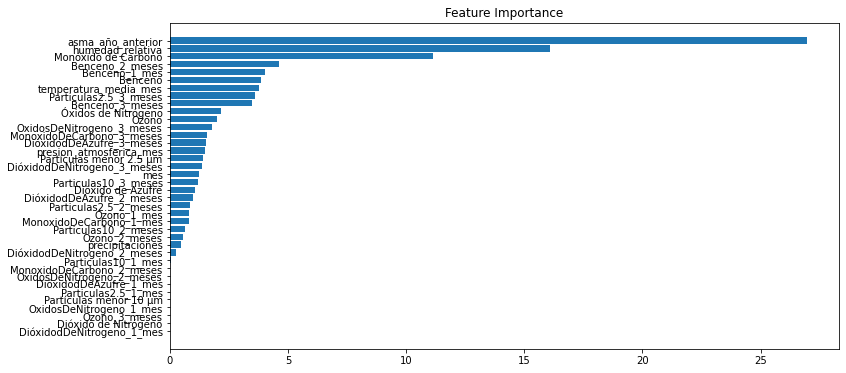

In [ ]:
feature_importance = final_model_cb_a.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

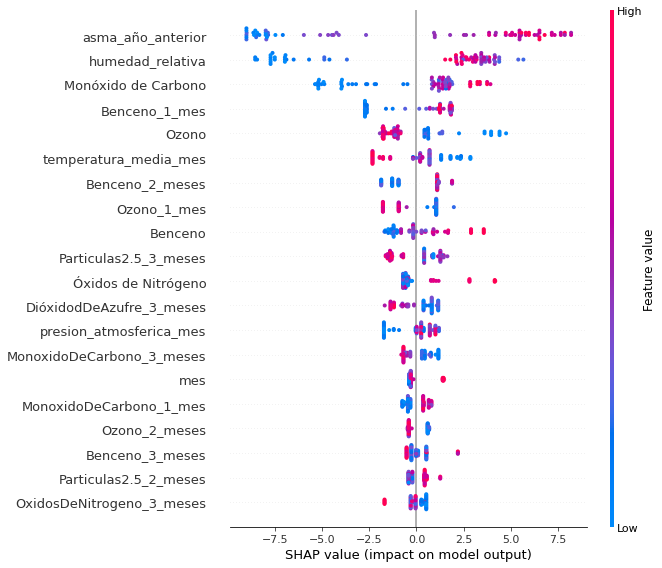

In [ ]:
explainer = shap.TreeExplainer(final_model_cb_a)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred3_a=final_model_cb_a.predict(X_train)
pred2_a=final_model_cb_a.predict(X_test)

In [ ]:
mae_cb_a_train,mape_cb_a_train,rmse_cb_a_train=mean_absolute_error(pred3_a,y_train),mean_absolute_percentage_error(pred3_a,y_train),np.sqrt(mean_squared_error(pred3_a,y_train))
mae_cb_a_test,mape_cb_a_test,rmse_cb_a_test=mean_absolute_error(pred2_a,y_test),mean_absolute_percentage_error(pred2_a,y_test),np.sqrt(mean_squared_error(pred2_a,y_test))

In [ ]:
errores_cb_a_train=[mae_cb_a_train,mape_cb_a_train,rmse_cb_a_train]
errores_cb_a_test=[mae_cb_a_test,mape_cb_a_test,rmse_cb_a_test]

In [ ]:
df_num_ingresos_a['predicciones_cb']=final_model_cb_a.predict(pd.concat([X_train,X_test]).sort_index())

## LightGBM para asma

In [ ]:
model3=LGBMRegressor()

In [ ]:
param_grid = {
    'num_iterations': [10, 20,30,40],
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.001,0.1]
}

In [ ]:
cv=RandomizedSearchCV(model3,param_grid,cv=5,n_jobs=-1)

In [ ]:
cv.fit(X_train,y_train)

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.001, 0.1],
                                        'max_depth': [2, 3, 4, 5],
                                        'num_iterations': [10, 20, 30, 40]})

In [ ]:
cv.best_params_,cv.best_score_

({'num_iterations': 40, 'max_depth': 3, 'learning_rate': 0.1},
 0.4848288263734585)

In [ ]:
final_model_lgb_a=LGBMRegressor(**cv.best_params_)
t=time.perf_counter()
final_model_lgb_a.fit(X_train, y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    early_stopping_rounds=5)

[1]	training's l2: 1367.09	valid_1's l2: 1275.55
[2]	training's l2: 1226.83	valid_1's l2: 1171.66
[3]	training's l2: 1107.58	valid_1's l2: 1107.2
[4]	training's l2: 1008.02	valid_1's l2: 1062.43
[5]	training's l2: 925.65	valid_1's l2: 983.136
[6]	training's l2: 850.712	valid_1's l2: 959.63
[7]	training's l2: 791.635	valid_1's l2: 870.989
[8]	training's l2: 731.199	valid_1's l2: 834.635
[9]	training's l2: 683.489	valid_1's l2: 827.798
[10]	training's l2: 639.539	valid_1's l2: 808.207
[11]	training's l2: 604.797	valid_1's l2: 754.98
[12]	training's l2: 574.07	valid_1's l2: 713.639
[13]	training's l2: 540.499	valid_1's l2: 694.807
[14]	training's l2: 512.317	valid_1's l2: 691.547
[15]	training's l2: 496.098	valid_1's l2: 665.765
[16]	training's l2: 473.112	valid_1's l2: 655.364
[17]	training's l2: 451.64	valid_1's l2: 631.486
[18]	training's l2: 434.9	valid_1's l2: 642.031
[19]	training's l2: 421.071	valid_1's l2: 622.577
[20]	training's l2: 408.155	valid_1's l2: 634.013
[21]	training's l

c:\Users\carlo\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.



LGBMRegressor(max_depth=3, num_iterations=40)

In [ ]:
elapsed_time = datetime.timedelta(seconds=(time.perf_counter() - t))
print('Tiempo de entrenamiento:', elapsed_time)

Tiempo de entrenamiento: 0:00:00.194997


Text(0.5, 1.0, 'Feature Importance')

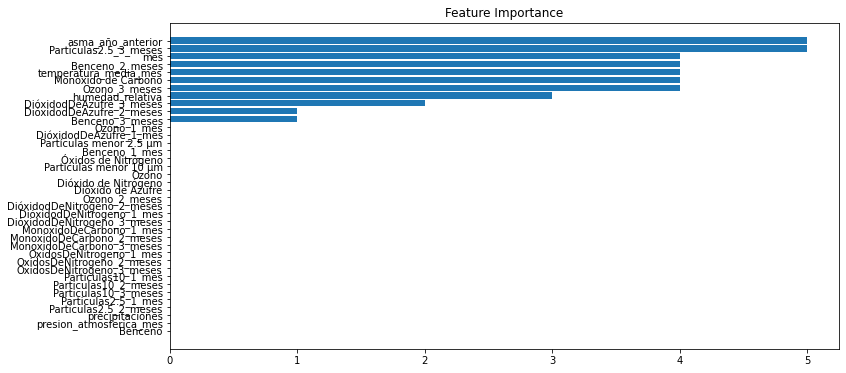

In [ ]:
feature_importance = final_model_lgb_a.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

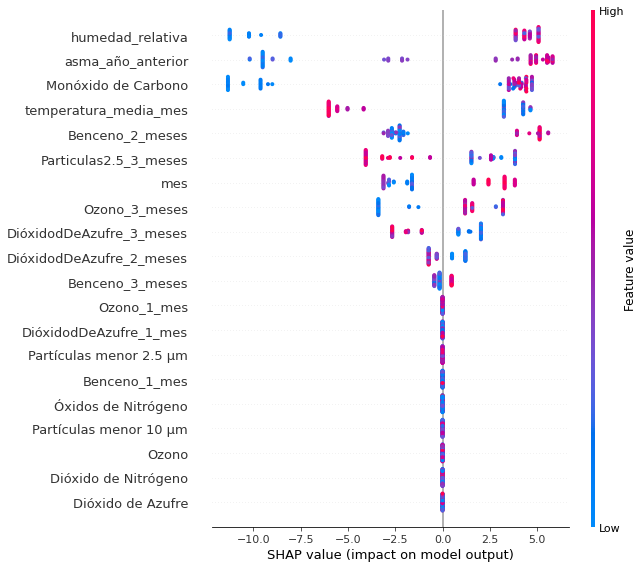

In [ ]:
explainer = shap.TreeExplainer(final_model_lgb_a)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
pred5_a=final_model_lgb_a.predict(X_train)
pred4_a=final_model_lgb_a.predict(X_test)

In [ ]:
mae_lgb_a_train,mape_lgb_a_train,rmse_lgb_a_train=mean_absolute_error(pred5_a,y_train),mean_absolute_percentage_error(pred5_a,y_train),np.sqrt(mean_squared_error(pred5_a,y_train))
mae_lgb_a_test,mape_lgb_a_test,rmse_lgb_a_test=mean_absolute_error(pred4_a,y_test),mean_absolute_percentage_error(pred4_a,y_test),np.sqrt(mean_squared_error(pred4_a,y_test))

In [ ]:
errores_lgb_a_train=[mae_lgb_a_train,mape_lgb_a_train,rmse_lgb_a_train]
errores_lgb_a_test=[mae_lgb_a_test,mape_lgb_a_test,rmse_lgb_a_test]

In [ ]:
df_errores_a_train=pd.DataFrame({'errores_xgb_a':errores_xgb_a_train,'errores_cb_a':errores_cb_a_train,'errores_lgb_a':errores_lgb_a_train},index=['MAE','MAPE','RMSE'])
df_errores_a_test=pd.DataFrame({'errores_xgb_a':errores_xgb_a_test,'errores_cb_a':errores_cb_a_test,'errores_lgb_a':errores_lgb_a_test},index=['MAE','MAPE','RMSE'])

In [ ]:
df_errores_a_train

,errores_xgb_a,errores_cb_a,errores_lgb_a
MAE,8.204032,16.155359,15.004880
MAPE,0.077144,0.159875,0.146463
RMSE,11.598249,21.553624,20.520004


In [ ]:
df_errores_a_test

,errores_xgb_a,errores_cb_a,errores_lgb_a
MAE,17.567870,21.276665,18.803174
MAPE,0.201769,0.229185,0.221026
RMSE,23.151918,25.156205,24.951486


In [ ]:
df_num_ingresos_a['predicciones_lgbm']=final_model_lgb_a.predict(pd.concat([X_train,X_test]).sort_index())

In [ ]:
px.line(df_num_ingresos_a,x='fecha',y=['asma','predicciones_lgbm','predicciones_cb','predicciones_xgb'])

# Diferencia porcentual entre datos reales y modelos

In [ ]:
df_comparativa_real_modelos = df_num_ingresos.merge(
    df_num_ingresos_a,
    how = 'outer',
    on = 'fecha',
    suffixes=('','_asma')
).merge(
    df_num_ingresos_nb,
    how = 'outer',
    on = 'fecha',
    suffixes=('','_neum_bact')
).merge(
    df_num_ingresos_epoc,
    how = 'outer',
    on = 'fecha',
    suffixes=('','_enf_pulm_obstr_cron')
)

df_comparativa_real_modelos.sample(5).T

,63,30,51,72,16
fecha,2013-11-01 00:00:00,2011-02-01 00:00:00,2012-11-01 00:00:00,2014-08-01 00:00:00,2009-12-01 00:00:00
numero_de_ingresos,1879.0,1859.0,1617.0,1088.0,1690.0
predicciones_xgb,1532.793335,1593.414062,1476.337524,1015.869263,1524.13916
predicciones_cb,1703.045855,1730.446996,1641.812244,1130.855564,1704.34683
predicciones_lgbm,1657.544681,1779.764126,1690.419396,1140.876886,1745.202877
asma,157.0,144.0,126.0,79.0,116.0
predicciones_xgb_asma,140.946182,135.615265,123.55603,71.690308,112.827805
predicciones_cb_asma,133.807818,129.638683,128.93644,72.42061,128.733232
predicciones_lgbm_asma,137.270384,124.769191,127.752956,78.531228,119.974474
neumonia bacteriana,273.0,247.0,211.0,115.0,238.0


In [ ]:
campos = [
    ['difer_porcent_xgb', 'predicciones_xgb', 'numero_de_ingresos'],
    ['difer_porcent_cb', 'predicciones_cb', 'numero_de_ingresos'],
    ['difer_porcent_lgbm', 'predicciones_lgbm', 'numero_de_ingresos'],
    ['difer_porcent_xgb_asma', 'predicciones_xgb_asma', 'asma'],
    ['difer_porcent_cb_asma', 'predicciones_cb_asma', 'asma'],
    ['difer_porcent_lgbm_asma', 'predicciones_lgbm_asma', 'asma'],
    ['difer_porcent_xgb_neum_bact', 'predicciones_xgb_neum_bact', 'neumonia bacteriana'],
    ['difer_porcent_cb_neum_bact', 'predicciones_cb_neum_bact', 'neumonia bacteriana'],
    ['difer_porcent_lgbm_neum_bact', 'predicciones_lgbm_neum_bact', 'neumonia bacteriana'],
    ['difer_porcent_xgb_enf_pulm_obstr_cron', 'predicciones_xgb_enf_pulm_obstr_cron', 'enfermedad pulmonar obstructiva cronica'],
    ['difer_porcent_cb_enf_pulm_obstr_cron', 'predicciones_cb_enf_pulm_obstr_cron', 'enfermedad pulmonar obstructiva cronica'],
    ['difer_porcent_lgbm_enf_pulm_obstr_cron', 'predicciones_lgbm_enf_pulm_obstr_cron', 'enfermedad pulmonar obstructiva cronica'],
]

for x in campos:
    df_comparativa_real_modelos[x[0]] = round(
        np.abs( ( ( df_comparativa_real_modelos[x[1]] - df_comparativa_real_modelos[x[2]] ) / df_comparativa_real_modelos[x[2]] ) * 100 ),
        2
    )

df_comparativa_real_modelos.sample(5).T

,35,37,47,8,77
fecha,2011-07-01 00:00:00,2011-09-01 00:00:00,2012-07-01 00:00:00,2009-04-01 00:00:00,2015-01-01 00:00:00
numero_de_ingresos,1044.0,1584.0,975.0,1475.0,1764.0
predicciones_xgb,976.508423,1416.052856,918.956116,1330.776733,1603.096191
predicciones_cb,1100.60254,1521.702134,1106.954114,1467.948906,1773.652789
predicciones_lgbm,1124.729202,1527.246307,1124.729202,1385.946008,1760.135125
asma,42.0,126.0,36.0,106.0,139.0
predicciones_xgb_asma,45.649139,121.734772,42.301899,108.594322,146.969101
predicciones_cb_asma,58.167644,116.399882,60.767323,109.249879,132.545536
predicciones_lgbm_asma,66.217538,114.572333,66.217538,105.498428,131.276125
neumonia bacteriana,136.0,212.0,116.0,205.0,287.0


In [ ]:
df_comparativa_real_modelos['year'] = df_comparativa_real_modelos.fecha.dt.year
df_comparativa_real_modelos['month'] = df_comparativa_real_modelos.fecha.dt.month

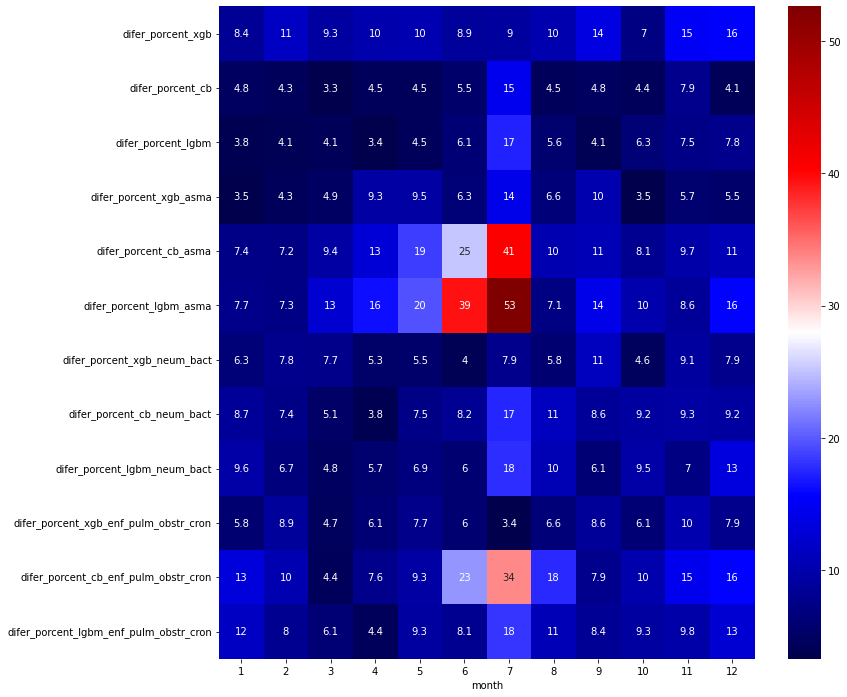

In [ ]:
fig = plt.subplots(figsize=(12,12))

_ = sns.heatmap(
    df_comparativa_real_modelos[[
    'month',
    'difer_porcent_xgb',
    'difer_porcent_cb',
    'difer_porcent_lgbm',
    'difer_porcent_xgb_asma',
    'difer_porcent_cb_asma',
    'difer_porcent_lgbm_asma',
    'difer_porcent_xgb_neum_bact',
    'difer_porcent_cb_neum_bact',
    'difer_porcent_lgbm_neum_bact',
    'difer_porcent_xgb_enf_pulm_obstr_cron',
    'difer_porcent_cb_enf_pulm_obstr_cron',
    'difer_porcent_lgbm_enf_pulm_obstr_cron',
]].groupby(['month']).mean([
    'difer_porcent_xgb',
    'difer_porcent_cb',
    'difer_porcent_lgbm',
    'difer_porcent_xgb_asma',
    'difer_porcent_cb_asma',
    'difer_porcent_lgbm_asma',
    'difer_porcent_xgb_neum_bact',
    'difer_porcent_cb_neum_bact',
    'difer_porcent_lgbm_neum_bact',
    'difer_porcent_xgb_enf_pulm_obstr_cron',
    'difer_porcent_cb_enf_pulm_obstr_cron',
    'difer_porcent_lgbm_enf_pulm_obstr_cron',
]).T,
    annot=True,
    cmap='seismic'
)